# REGIONAL REGRASJONSANALYSE AV TOTALT TILSIG/MAGASINVOLUM
## Tipper/predikerer foregående ukes verdi
Dette scriptet utfører en estimering det totale tilsiget (ukjent+kjent) i hver av regionene: NO1-NO5 og SE1-SE4. Tippingen på tilsig og/eller magasin er basert på regresjon fra en mengde kjente serier for bla. tilsig og magasinvolum. Tippingen skrives til seriene regest% (søk i tidsserier). 

Beskrivelse av metoden:
1. Leser inn kjente serier for tilsig og/eller magasinvolum fra SMG, og henter ukesverdiene. Dette gjøres i egen celle slik at man kan kun trenger å lese inn en gang siden dette tar noen minutter.
2. Leser inn fasiten, og regner så ut korrelasjonen (R2) mellom faiten og inputseriene. Et antall serier som skal tas med videre velges så utifra "ant_kandidater" med høyeste korrelasjon med fasiten.
3. Kjøre regresjon så langt tilbake som vi har data (2015.06.08), og luker ut den høyeste p-verdien. Dette kjøres om og om igjen helt til den høyeste p-verdien er laveren enn "max_p".
4. Til slutt kjøres en regresjon på en kortere periode (reg_period) med utvalget av serier som har blitt gjort i steg 2 og 3. Resultatet fra denne regresjonen blir modellen som brukes til å estimere/tippe neste ukes verdi.
5. Scriptet gjør 10 slike tippinger, 10 uker tilbake i tid, for hver kjøring. 

Tuning av regresjonen utføres ved å spesifisere ant_kandidater, max_p og reg_period, som når man er fornøyd kan oppdateres i default_input_variables. For at dette skal bli brukt i autojobben, må man ta kontakt med Sarah, slik at dette kan legges inn i PyCharm scriptet som utfører autojobben (tirsdag 06:00 og 11:00).

Scriptet er laget av Sarah Gjermo, på bestilling fra Svein Farstad. Sist endret 06.05.2019.

## INNLESNING OG KLARGJØRING
Kjøres kun en gang!

In [1]:
from regression_modules import *
import time

%load_ext autoreload
%autoreload 2

auto_input = {}
auto_input['tilsig'] = read_and_setup('tilsig')
auto_input['magasin'] = read_and_setup('magasin')

---------------------------------------------------------------
                        TILSIG                                 
---------------------------------------------------------------
Forventet innlesingstid er +/-180 sekunder.
Leser nå NO1..
Leser nå NO2..
Leser nå NO3..
Leser nå NO4..
Leser nå NO5..
Leser nå SE1..
Leser nå SE2..
Leser nå SE3..
Leser nå SE4..
Leser nå Tilsig kjente pr prisområde..
Leser nå Tilsig ukjente pr prisområde..
Leser nå BesteEstimat, Q_obse, Q_NFB..
Leser nå Tilsig basert på magasinendring pluss Kpp-prod, Del1..
Leser nå Del2..
Leser nå Del3..
Leser nå Del4..
Leser nå Del5..
Leser nå Tilsiget pr kraftverksområde: Del1..
Leser nå Del2..
Leser nå Del3..
Leser nå Del4..
Leser nå Del5..
Leser nå Del6..
Leser nå NVE1..
Leser nå NVE2..
Leser nå NVE3..
Leser nå NVE4..
Leser nå NVE5..
Leser nå NVE6..
Leser nå NVE7..
Mandag det tippes for:  2019.07.22

-------------------Feil i kjente tilsig verdier--------------------
-15.330000000000002 /Skel-Uddjaur.Storav-

## KJØRING
Her kan du velge å kjøre regresjonen for alle regioner, og for magasin og tilsig i ett f.eks, slik:

    var = ['Magasin','Tilsig']
    reg = ['NO1','NO2','NO3','NO4','NO5','SE1','SE2','SE3','SE4']
    for variable in var:
        for region in reg:
            show_result_input = make_estimate_and_write(variable, region, auto_input[variable])
            show_result(show_result_input)


Skriver estimerte verdier til:  RegEstimatMagNO1...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO1.......-U9104S0BT0132
Time to run write_V_SMG_Regresjon:  0.15637993812561035

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO1.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.22.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.06.29 til: 2019.07.22, satt til 212 uker.
Valgte 92 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99985
R2 mellom fasit og tipping: 0.99958

Fasit:
 2019-07-01 00:00:00+01:00    80.499986
2019-07-08 00:00:00+01:00    80.500000
2019-07-15 00:00:00+01:00    79.400000
2019-07-22 00:00:00+01:00    79.500000
Name: /Norg-NO1.Fasit.....-U9104A5R-0132, dtype: 

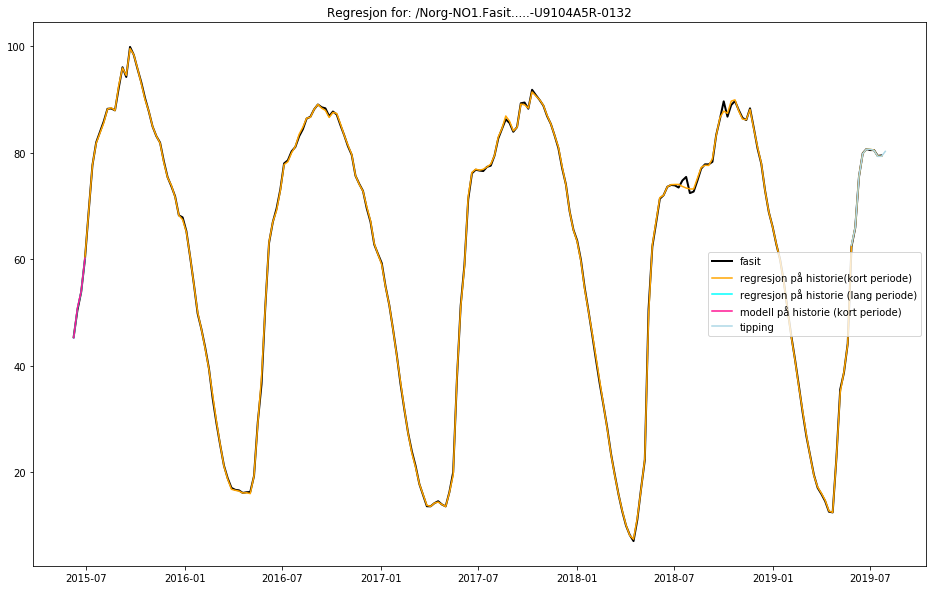

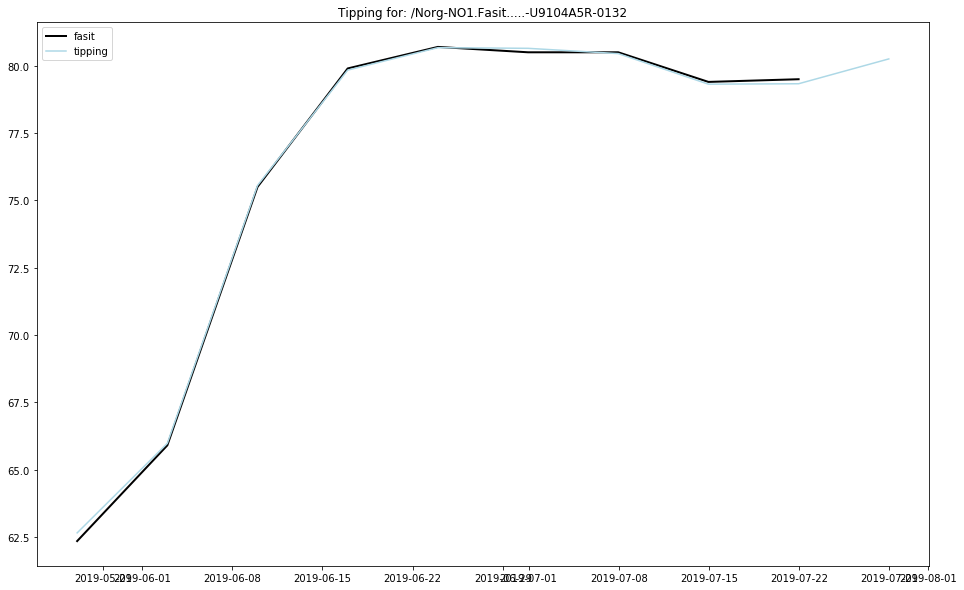

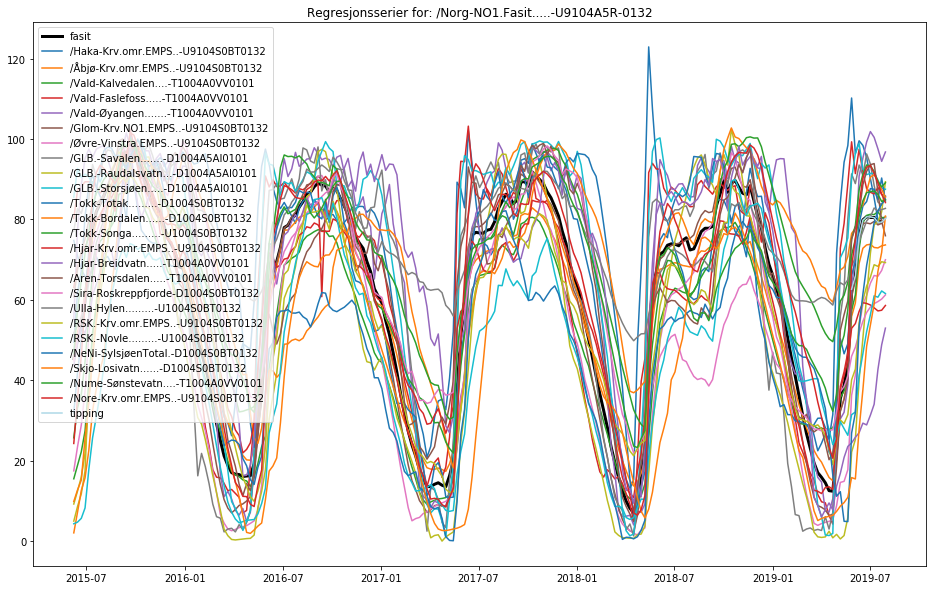


Skriver estimerte verdier til:  RegEstimatMagNO2...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO2.......-U9104S0BT0132
Time to run write_V_SMG_Regresjon:  0.2658426761627197

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO2.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.22.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.08.03 til: 2019.07.22, satt til 207 uker.
Valgte 162 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99987
R2 mellom fasit og tipping: 0.99961

Fasit:
 2019-07-01 00:00:00+01:00    73.300033
2019-07-08 00:00:00+01:00    74.400000
2019-07-15 00:00:00+01:00    73.900000
2019-07-22 00:00:00+01:00    73.600000
Name: /Norg-NO2.Fasit.....-U9104A5R-0132, dtype: 

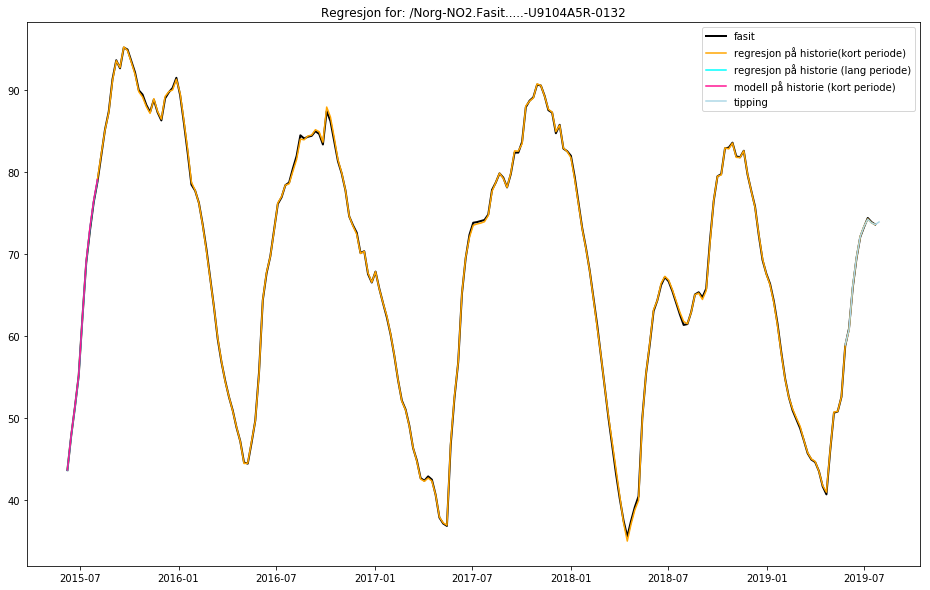

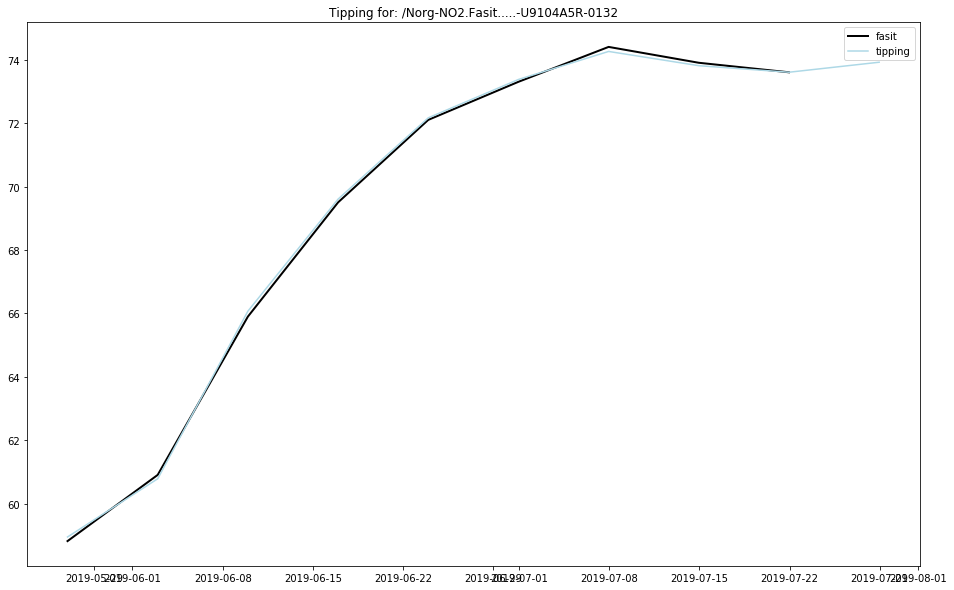

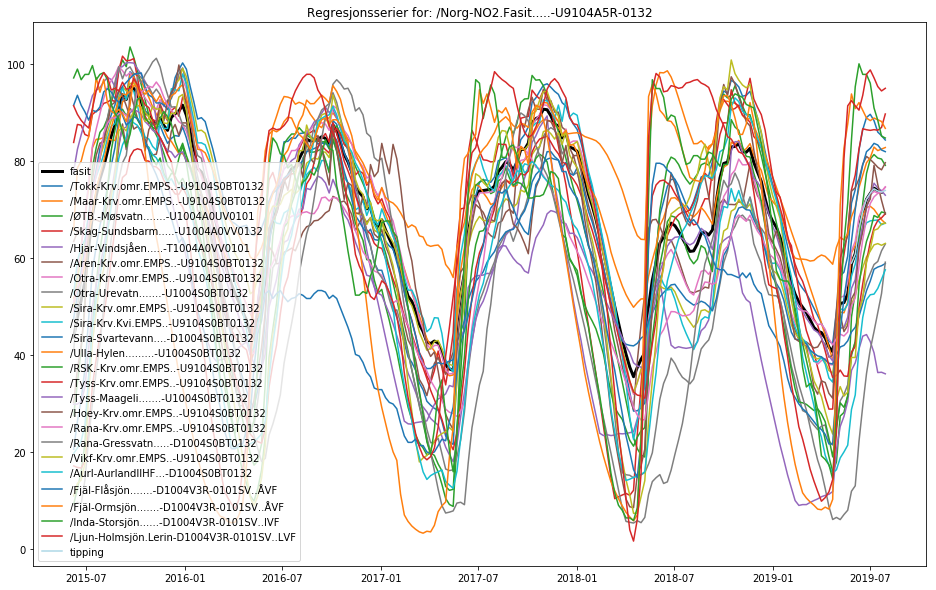


Skriver estimerte verdier til:  RegEstimatMagNO3...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO3.......-U9104S0BT0132
Time to run write_V_SMG_Regresjon:  0.12506413459777832

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO3.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.22.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.02.29 til: 2019.07.22, satt til 177 uker.
Valgte 96 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99982
R2 mellom fasit og tipping: 0.99953

Fasit:
 2019-07-01 00:00:00+01:00    79.999956
2019-07-08 00:00:00+01:00    82.799991
2019-07-15 00:00:00+01:00    82.099991
2019-07-22 00:00:00+01:00    81.599991
Name: /Norg-NO3.Fasit.....-U9104A5R-0132, dtype: 

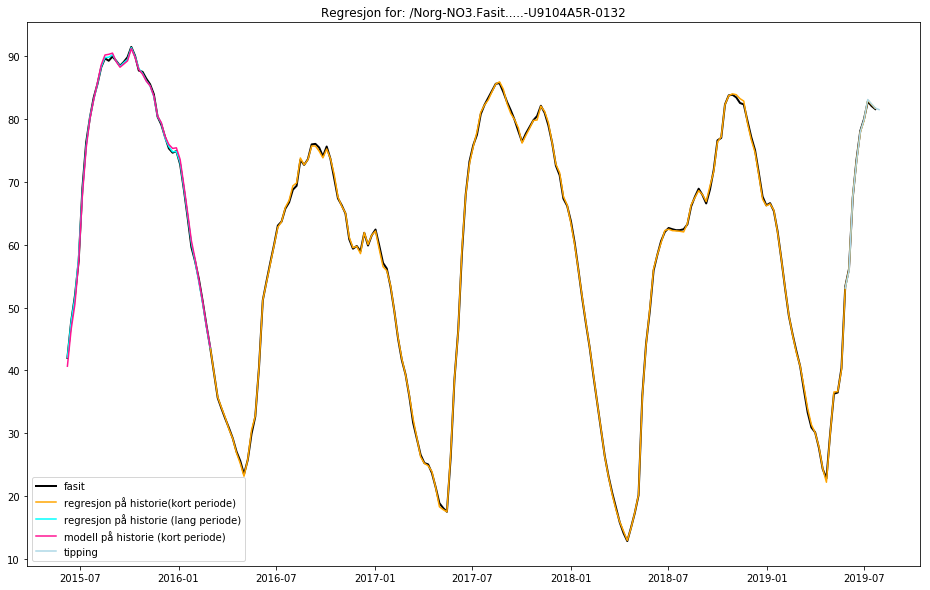

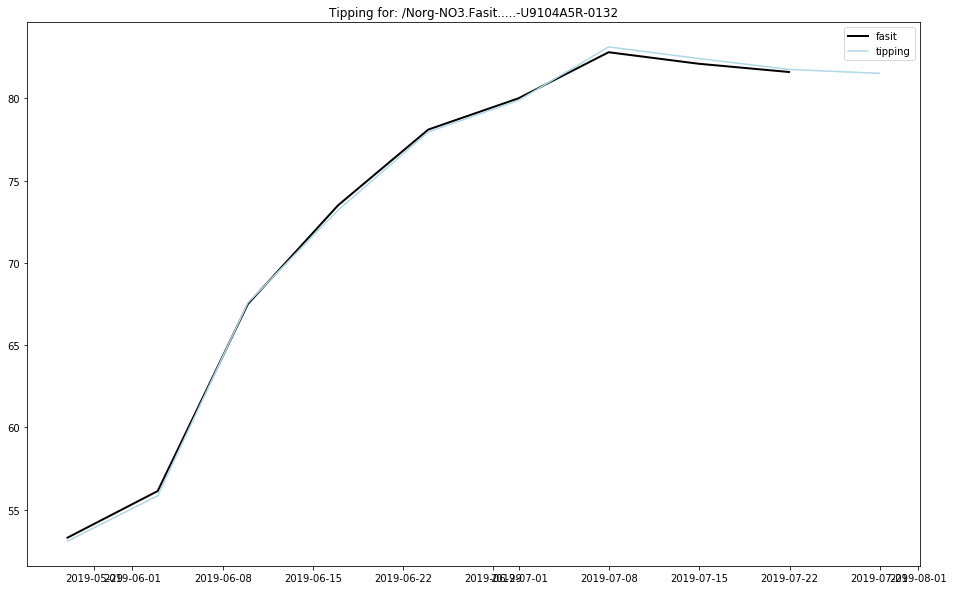

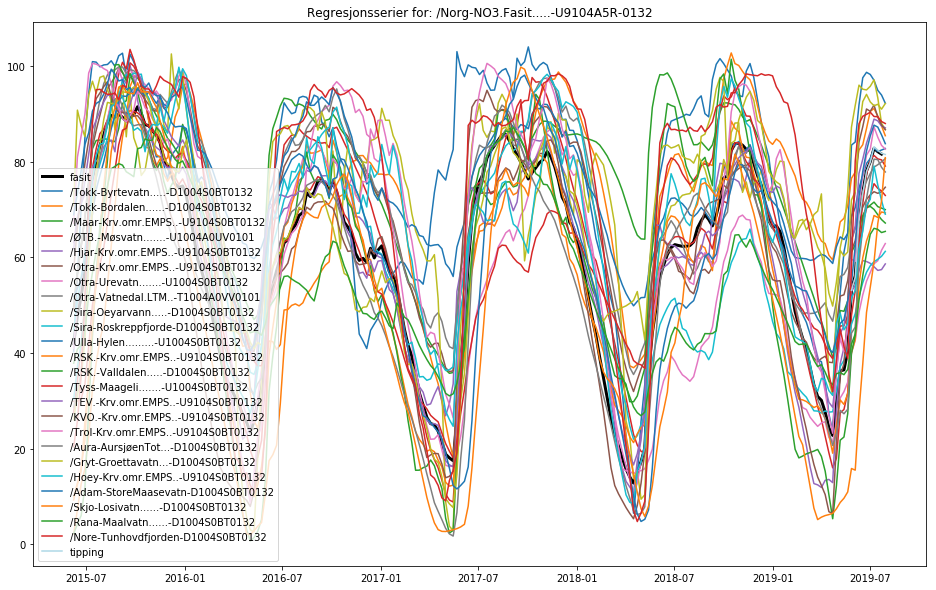


Skriver estimerte verdier til:  RegEstimatMagNO4...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO4.......-U9104S0BT0132
Time to run write_V_SMG_Regresjon:  0.14069151878356934

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO4.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.22.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.12.25 til: 2019.07.22, satt til 82 uker.
Valgte 112 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99989
R2 mellom fasit og tipping: 0.99987

Fasit:
 2019-07-01 00:00:00+01:00    63.300166
2019-07-08 00:00:00+01:00    65.599985
2019-07-15 00:00:00+01:00    67.199985
2019-07-22 00:00:00+01:00    68.399985
Name: /Norg-NO4.Fasit.....-U9104A5R-0132, dtype: 

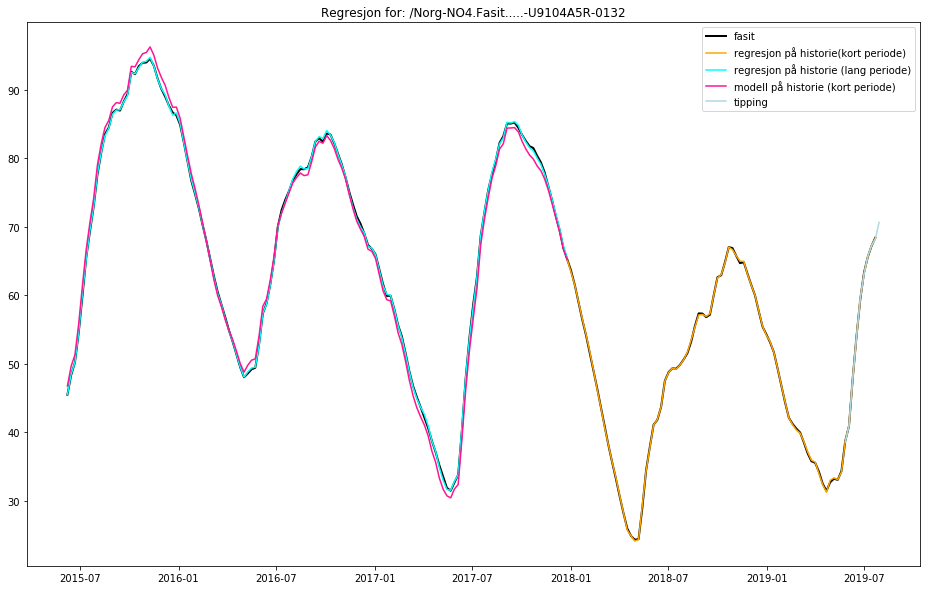

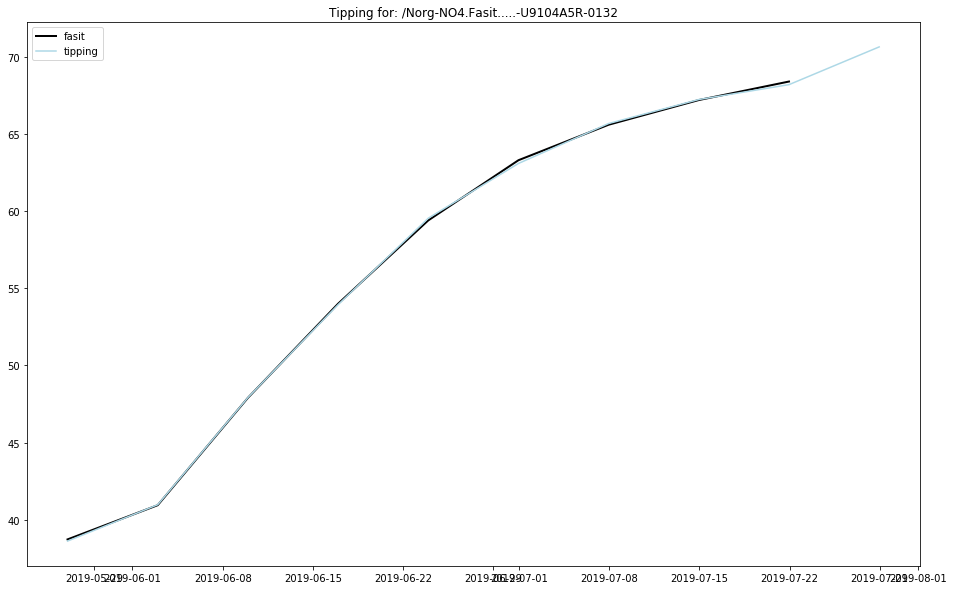

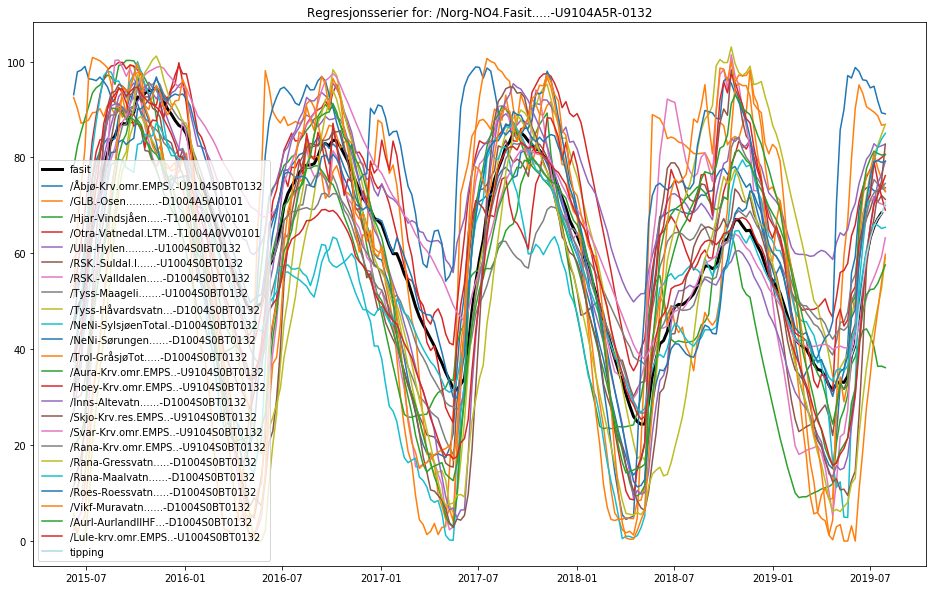


Skriver estimerte verdier til:  RegEstimatMagNO5...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO5.......-U9104S0BT0132
Time to run write_V_SMG_Regresjon:  0.1250593662261963

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO5.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.22.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.02.29 til: 2019.07.22, satt til 177 uker.
Valgte 150 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99990
R2 mellom fasit og tipping: 0.99971

Fasit:
 2019-07-01 00:00:00+01:00    65.200093
2019-07-08 00:00:00+01:00    67.599993
2019-07-15 00:00:00+01:00    67.499993
2019-07-22 00:00:00+01:00    68.199993
Name: /Norg-NO5.Fasit.....-U9104A5R-0132, dtype: 

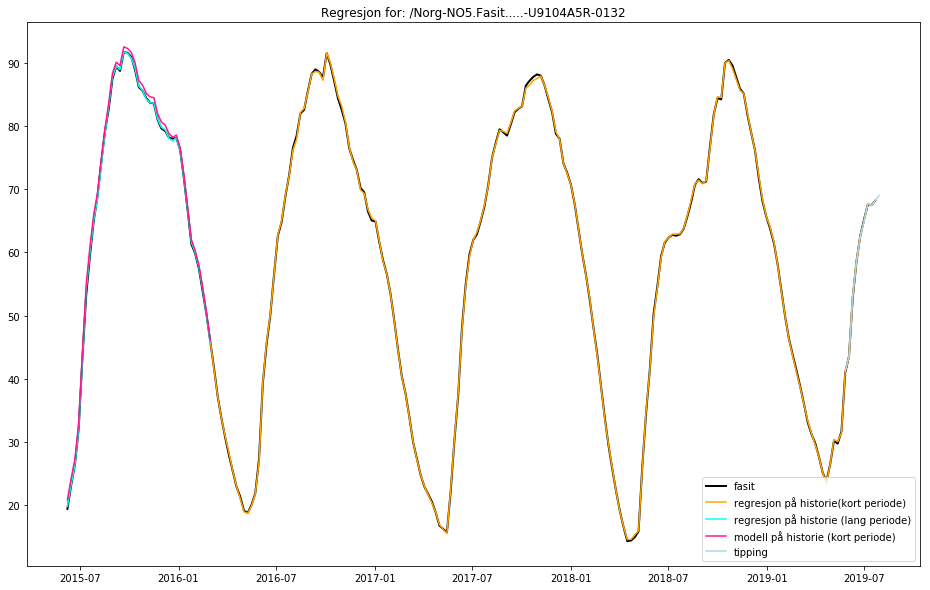

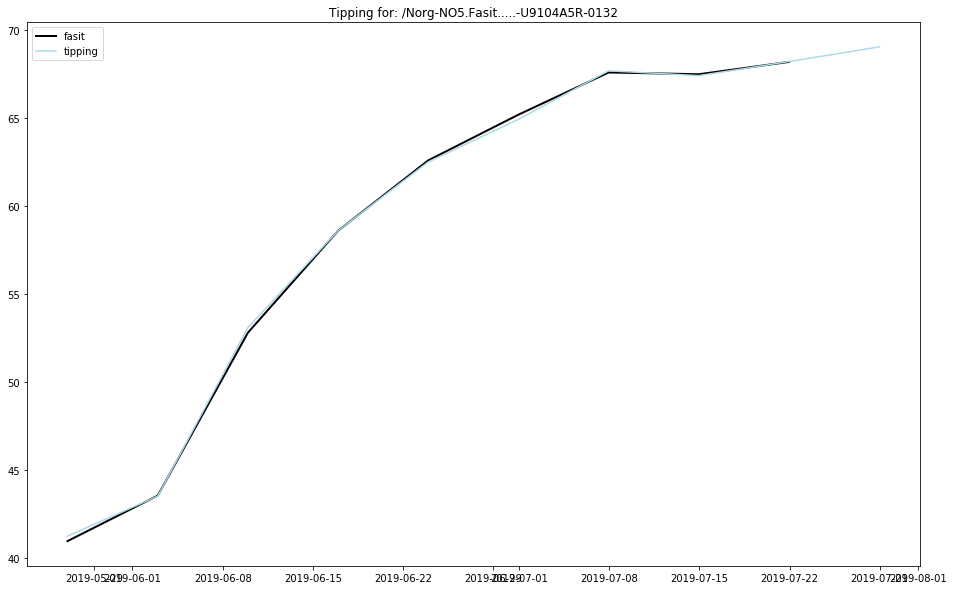

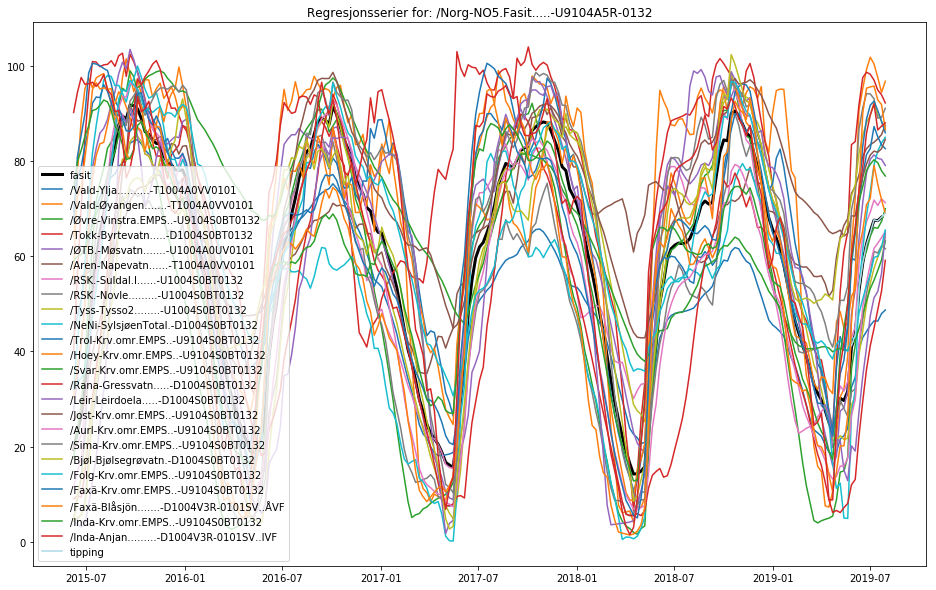


Skriver estimerte verdier til:  RegEstimatMagSE1...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE1.......-U9104S0BT0132
Time to run write_V_SMG_Regresjon:  0.1562802791595459

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE1.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.22.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2018.08.27 til: 2019.07.22, satt til 47 uker.
Valgte 114 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99998
R2 mellom fasit og tipping: 0.99958

Fasit:
 2019-07-01 00:00:00+01:00    62.8
2019-07-08 00:00:00+01:00    66.8
2019-07-15 00:00:00+01:00    69.5
2019-07-22 00:00:00+01:00    71.1
Name: /Sver-SE1.Fasit.....-U9104A5R-0132, dtype: float64

Moddelert/Ti

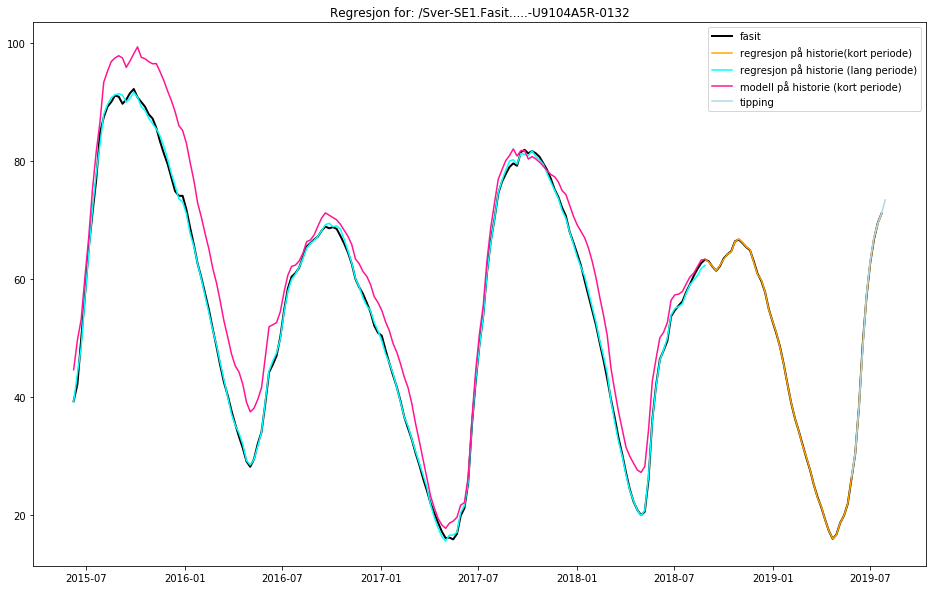

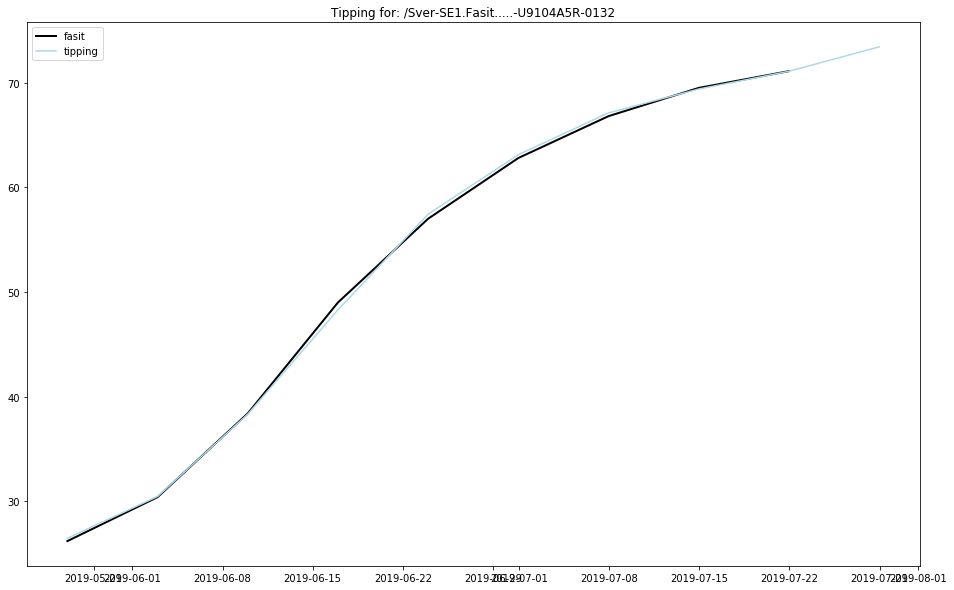

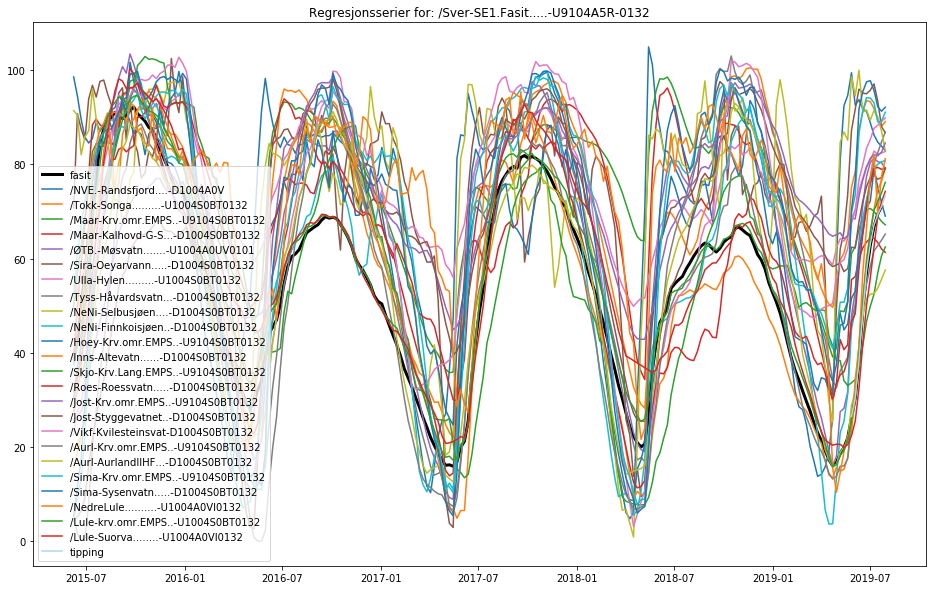


Skriver estimerte verdier til:  RegEstimatMagSE2...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE2.......-U9104S0BT0132
Time to run write_V_SMG_Regresjon:  0.1250612735748291

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE2.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.22.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.06.13 til: 2019.07.22, satt til 162 uker.
Valgte 158 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 21 stk.
R2 for regresjonen (kort periode): 0.99974
R2 mellom fasit og tipping: 0.99960

Fasit:
 2019-07-01 00:00:00+01:00    86.3
2019-07-08 00:00:00+01:00    86.7
2019-07-15 00:00:00+01:00    85.6
2019-07-22 00:00:00+01:00    84.1
Freq: W-SUN, Name: /Sver-SE2.Fasit.....-U9104A5R-0132, dtype: float64

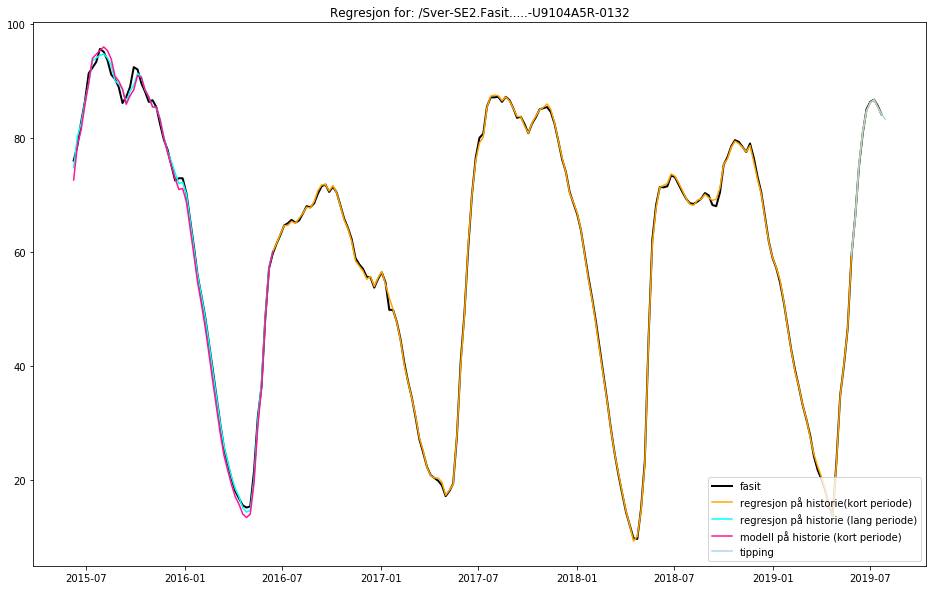

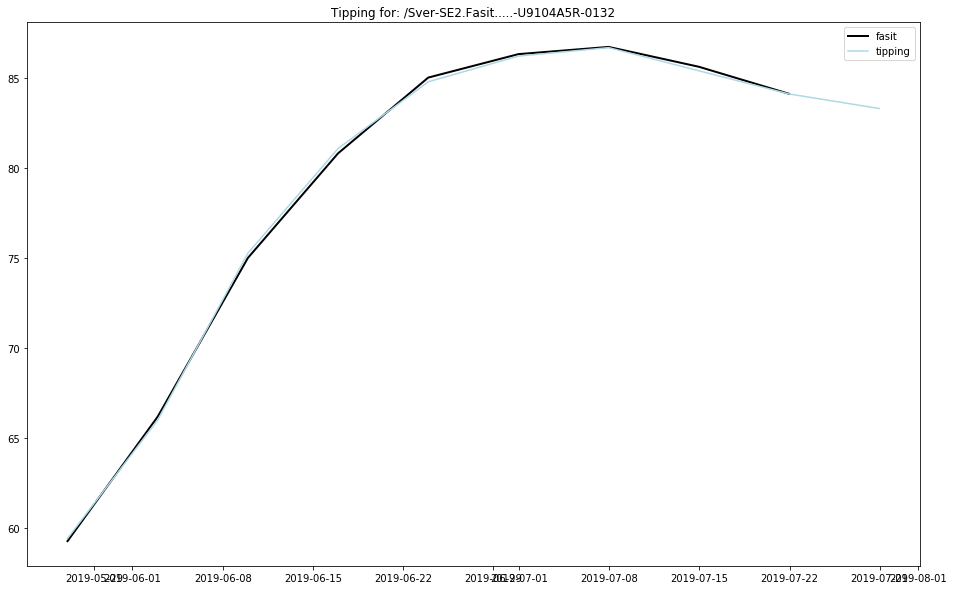

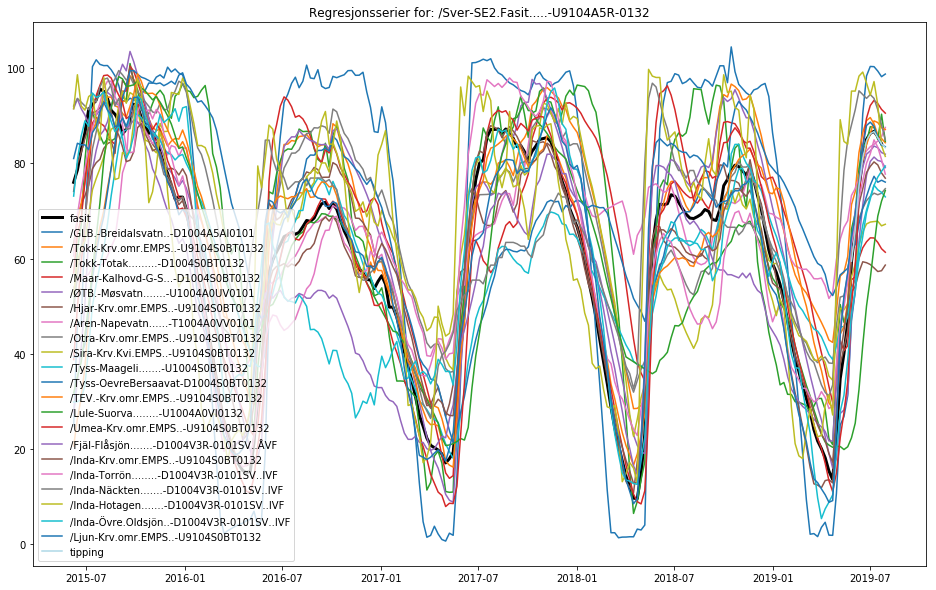


Skriver estimerte verdier til:  RegEstimatMagSE3...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE3.......-U9104S0BT0132
Time to run write_V_SMG_Regresjon:  0.5470662117004395

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE3.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.22.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2018.07.23 til: 2019.07.22, satt til 52 uker.
Valgte 150 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99893
R2 mellom fasit og tipping: 0.93905

Fasit:
 2019-07-01 00:00:00+01:00    78.6
2019-07-08 00:00:00+01:00    78.4
2019-07-15 00:00:00+01:00    77.1
2019-07-22 00:00:00+01:00    76.3
Freq: W-SUN, Name: /Sver-SE3.Fasit.....-U9104A5R-0132, dtype: float64


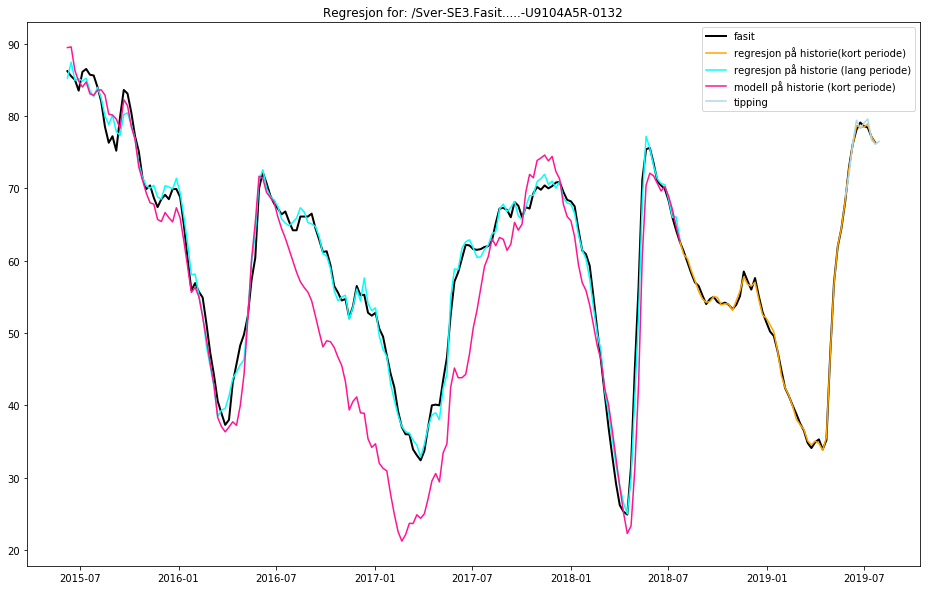

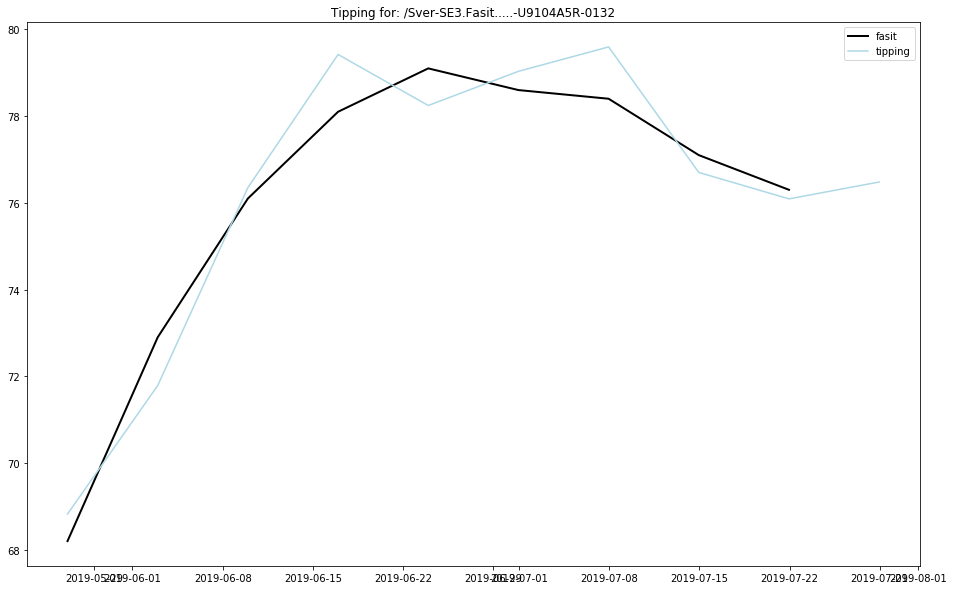

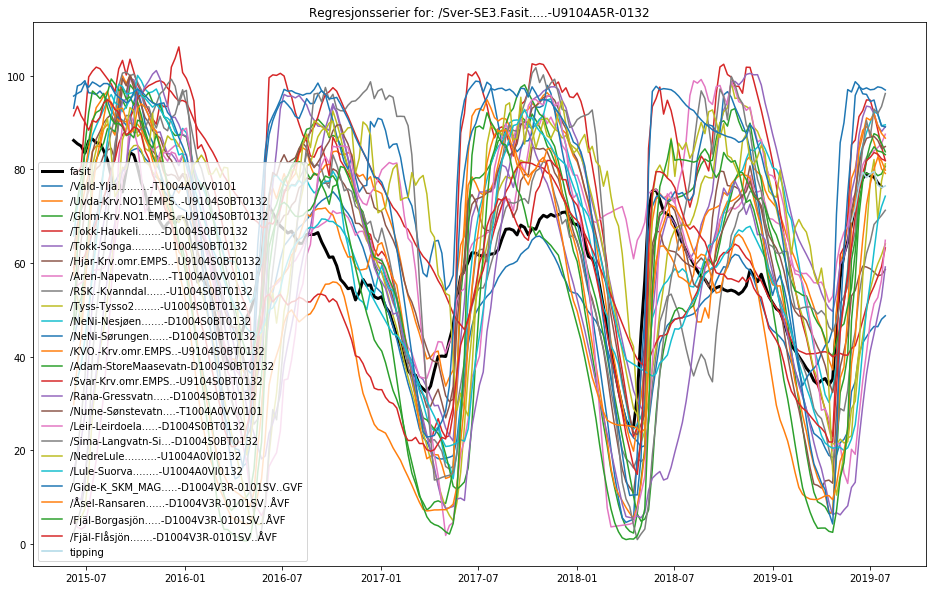


Skriver estimerte verdier til:  RegEstimatMagSE4...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE4.......-U9104S0BT0132
Time to run write_V_SMG_Regresjon:  0.4376802444458008

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE4.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.22.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.04.04 til: 2019.07.22, satt til 172 uker.
Valgte 170 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99784
R2 mellom fasit og tipping: 0.90066

Fasit:
 2019-07-01 00:00:00+01:00    54.9
2019-07-08 00:00:00+01:00    52.7
2019-07-15 00:00:00+01:00    51.3
2019-07-22 00:00:00+01:00    48.7
Freq: W-SUN, Name: /Sver-SE4.Fasit.....-U9104A5R-0132, dtype: float64

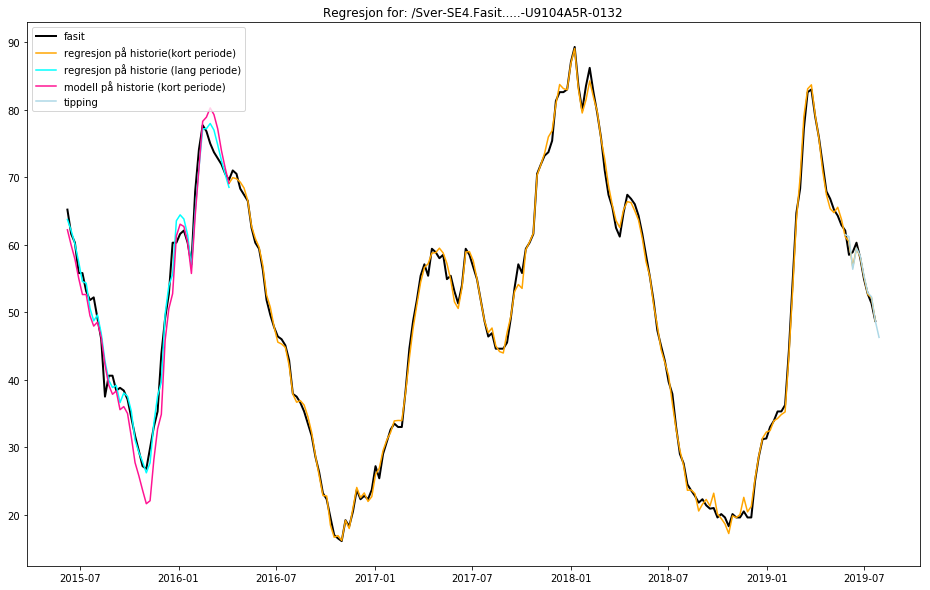

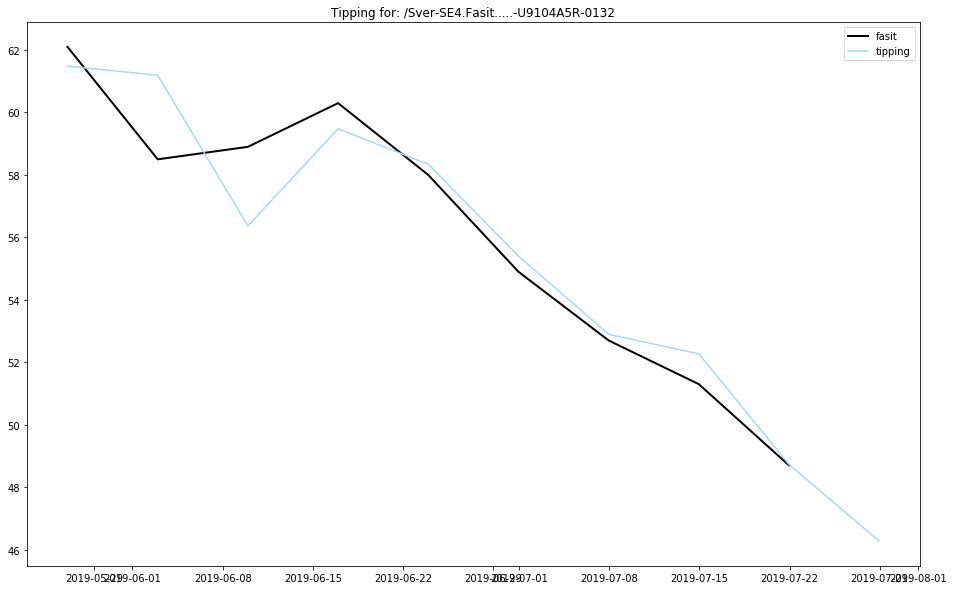

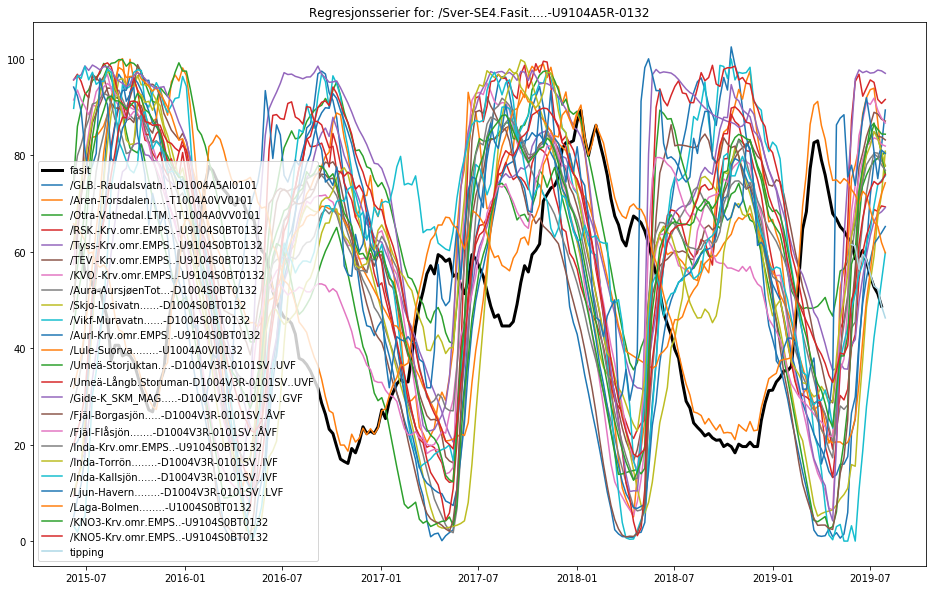


Skriver estimerte verdier til:  RegEstimatTilsigNO1-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO1.-U9100S0BT0105
Time to run write_V_SMG_Regresjon:  0.265775203704834

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No1.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.06.01 til: 2019.07.15, satt til 215 uker.
Valgte 172 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 8 stk.
R2 for regresjonen (kort periode): 0.99410
R2 mellom fasit og tipping: 0.99923

Fasit:
 2019-06-24 00:00:00+01:00    373.10517
2019-07-01 00:00:00+01:00    315.74883
2019-07-08 00:00:00+01:00    210.16300
2019-07-15 00:00:00+01:00    250.48700
Freq: W-SUN, Name: /Norg-No1.Fasit.....-U9100S0BT0105,

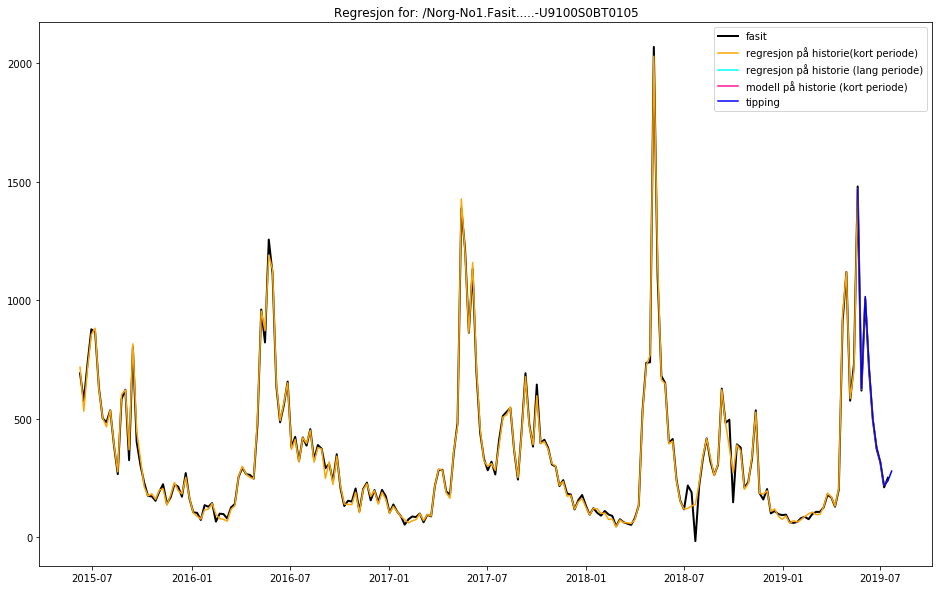

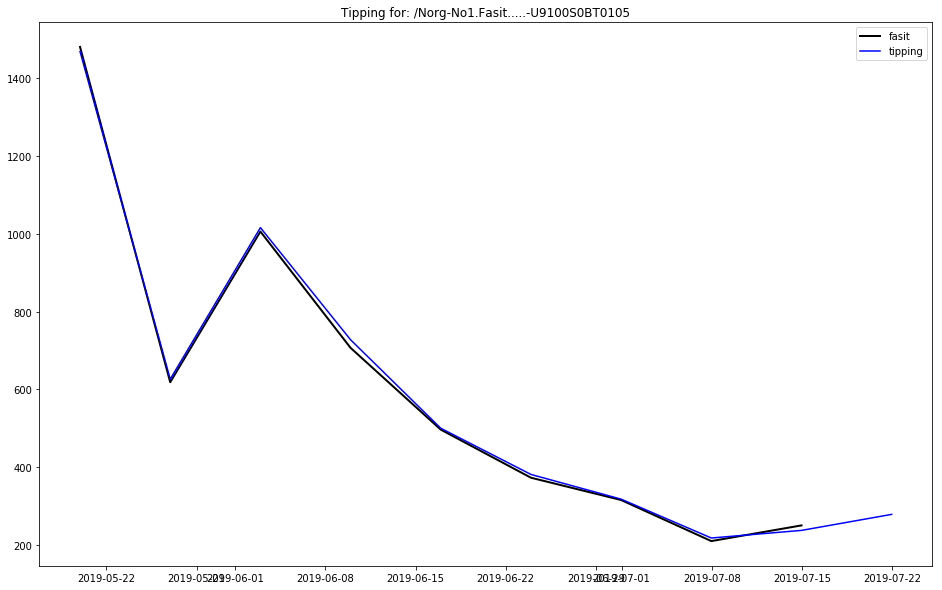

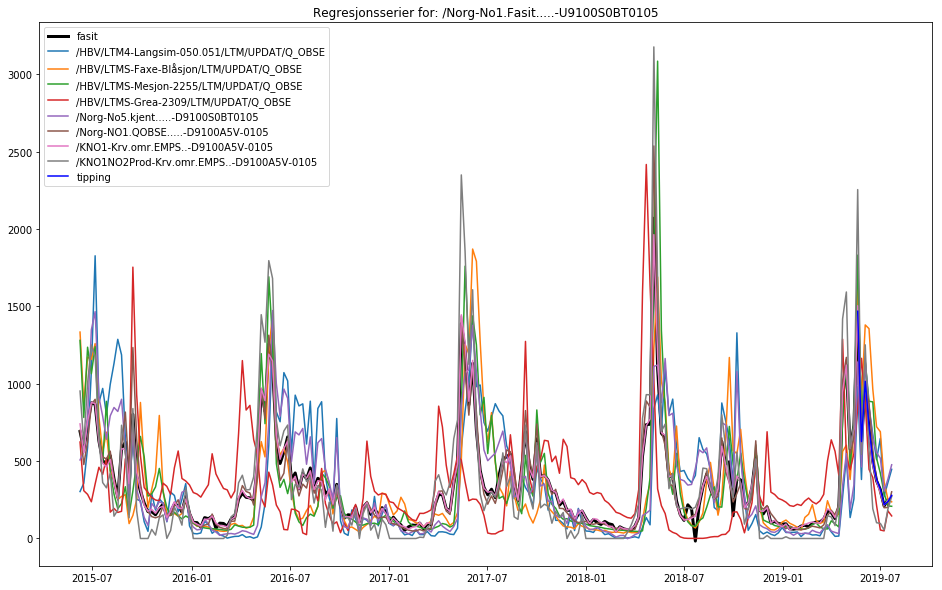


Skriver estimerte verdier til:  RegEstimatTilsigNO2-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO2.-U9100S0BT0105
Time to run write_V_SMG_Regresjon:  0.5158147811889648

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No2.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.01.18 til: 2019.07.15, satt til 182 uker.
Valgte 176 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
R2 for regresjonen (kort periode): 0.99682
R2 mellom fasit og tipping: 0.99305

Fasit:
 2019-06-24 00:00:00+01:00    802.215654
2019-07-01 00:00:00+01:00    772.665723
2019-07-08 00:00:00+01:00    345.298005
2019-07-15 00:00:00+01:00    465.380603
Freq: W-SUN, Name: /Norg-No2.Fasit.....-U9100S0B

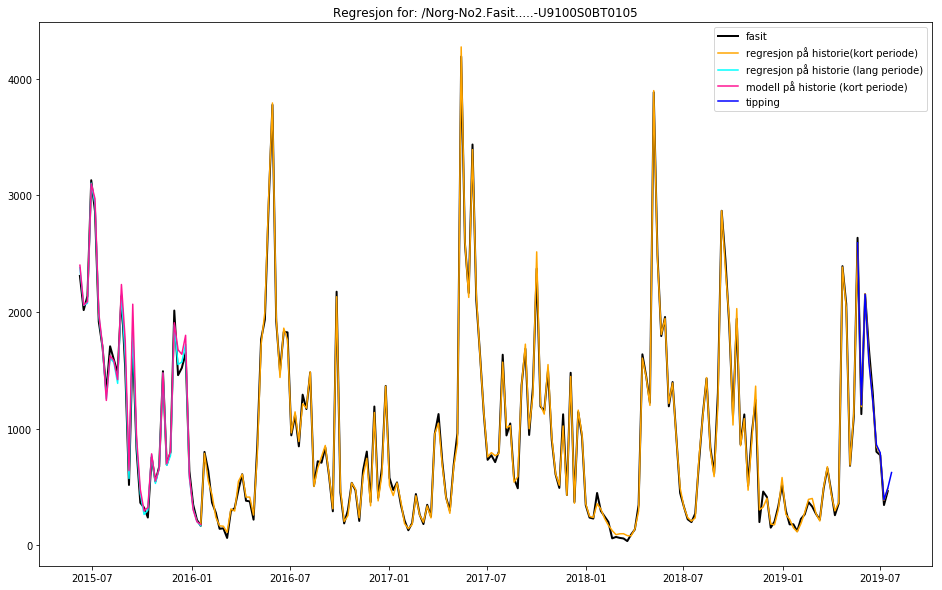

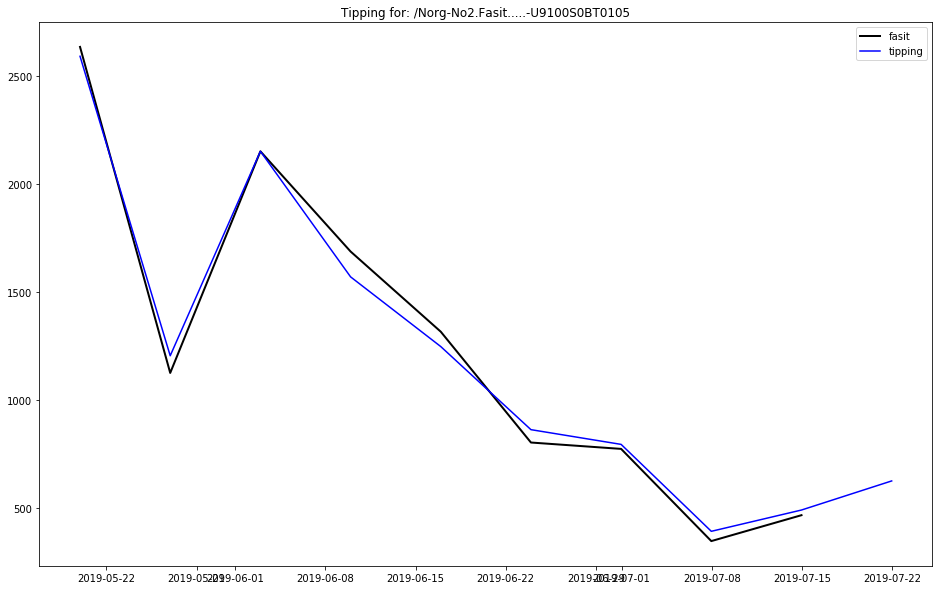

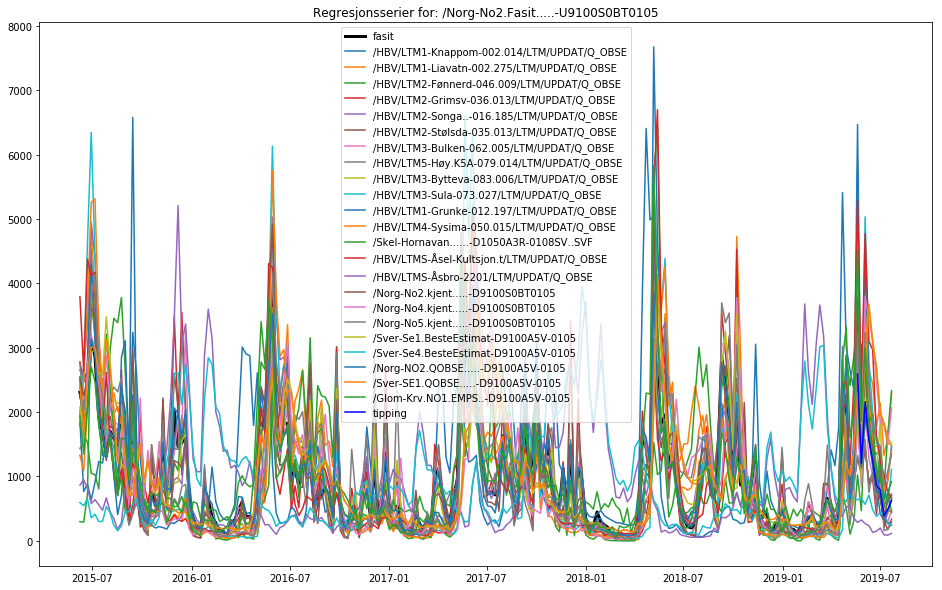


Skriver estimerte verdier til:  RegEstimatTilsigNO3-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO3.-U9100S0BT0105
Time to run write_V_SMG_Regresjon:  0.3907911777496338

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No3.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.10.09 til: 2019.07.15, satt til 92 uker.
Valgte 132 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
R2 for regresjonen (kort periode): 0.99685
R2 mellom fasit og tipping: 0.99627

Fasit:
 2019-06-24 00:00:00+01:00    529.347168
2019-07-01 00:00:00+01:00    669.257325
2019-07-08 00:00:00+01:00    310.822948
2019-07-15 00:00:00+01:00    300.835820
Freq: W-SUN, Name: /Norg-No3.Fasit.....-U9100S0BT

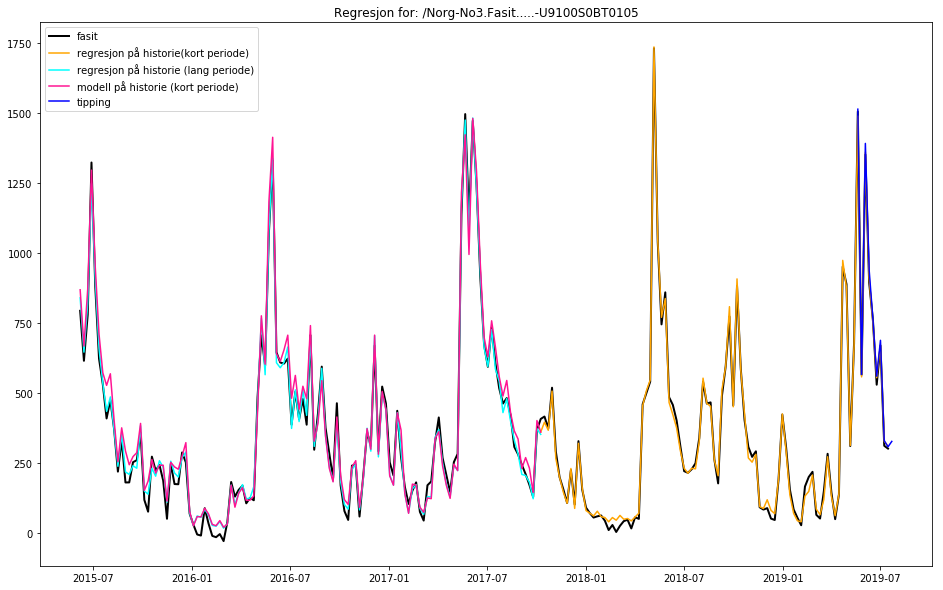

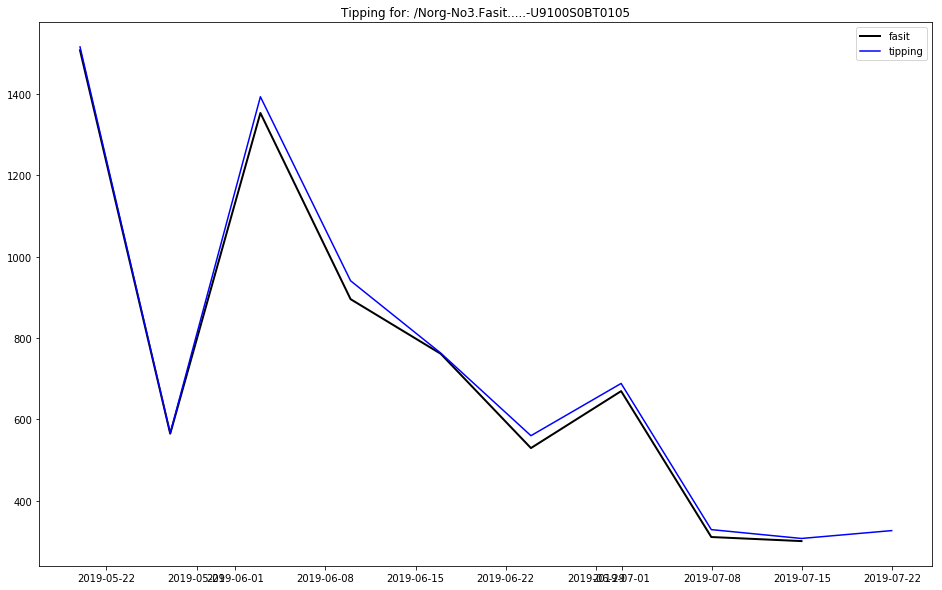

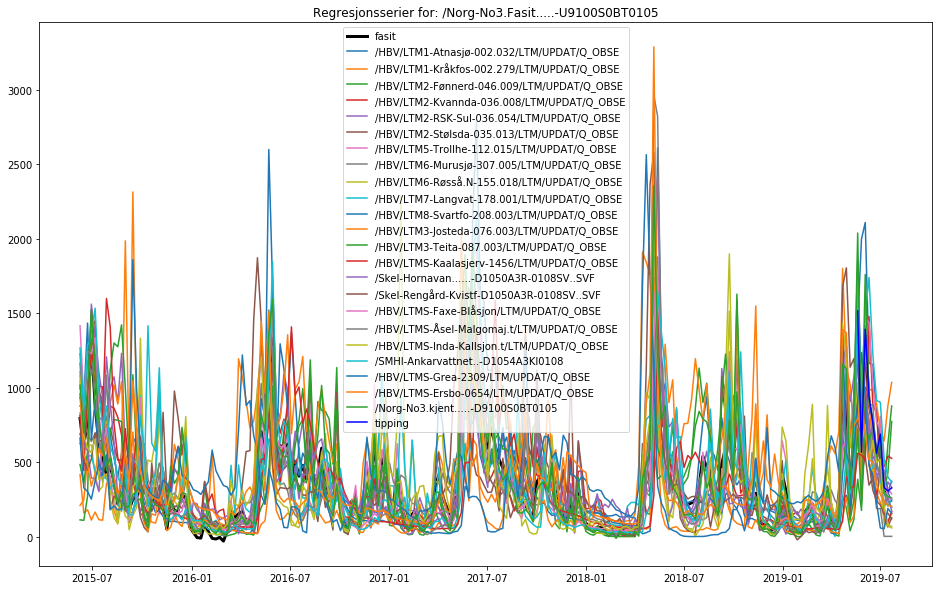


Skriver estimerte verdier til:  RegEstimatTilsigNO4-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO4.-U9100S0BT0105
Time to run write_V_SMG_Regresjon:  0.4220595359802246

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No4.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.11.09 til: 2019.07.15, satt til 192 uker.
Valgte 168 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99714
R2 mellom fasit og tipping: 0.99555

Fasit:
 2019-06-24 00:00:00+01:00    1182.877923
2019-07-01 00:00:00+01:00     884.440944
2019-07-08 00:00:00+01:00     789.985992
2019-07-15 00:00:00+01:00     681.273754
Freq: W-SUN, Name: /Norg-No4.Fasit.....-U910

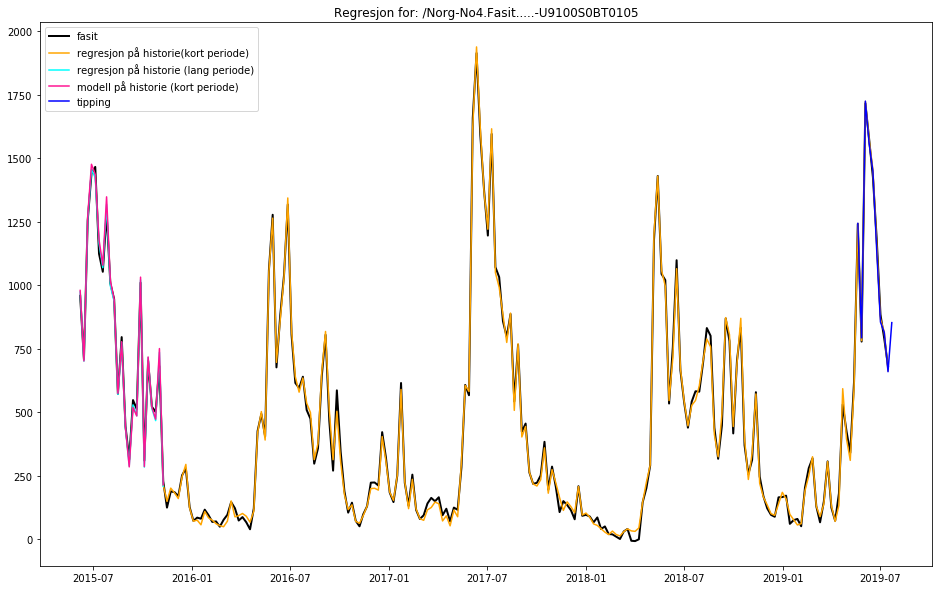

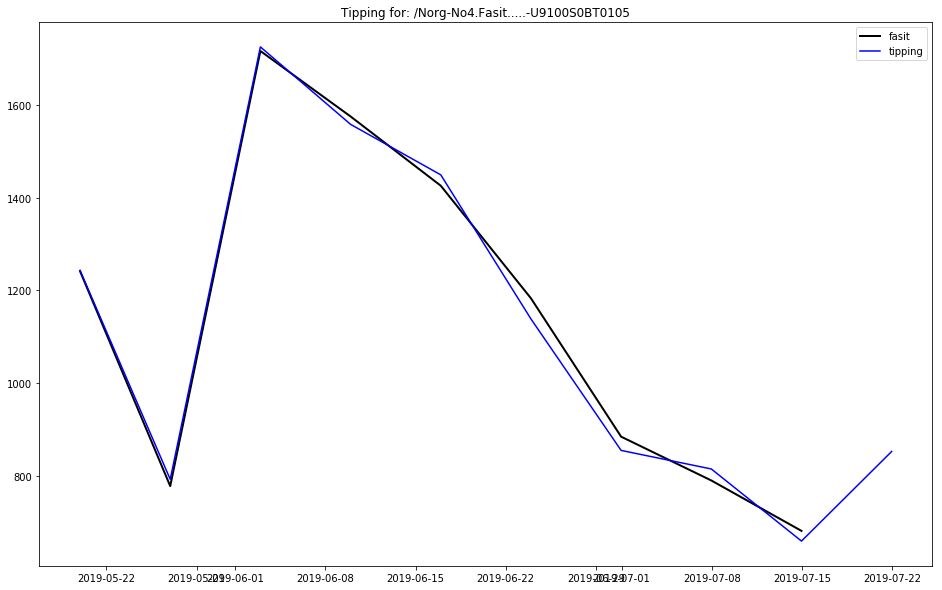

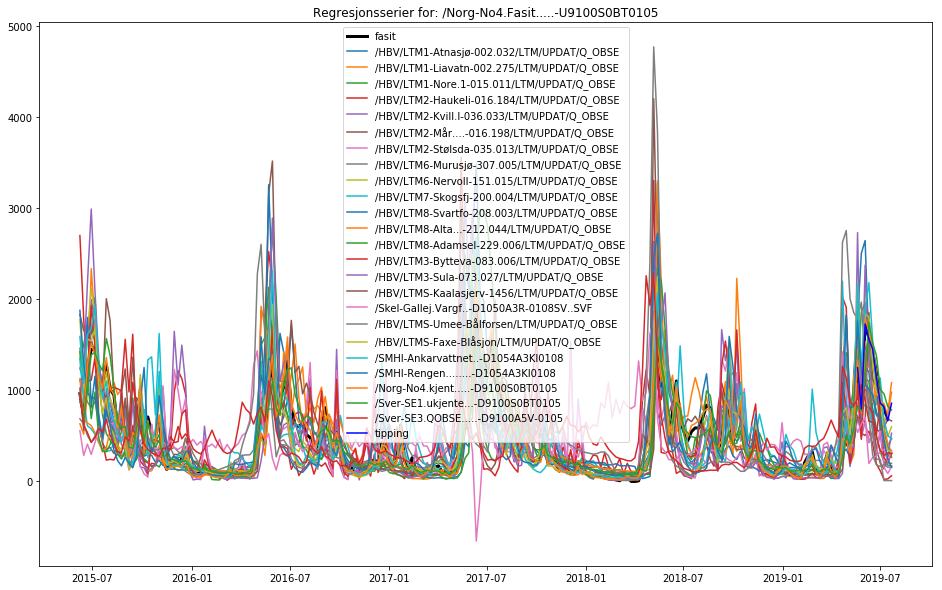


Skriver estimerte verdier til:  RegEstimatTilsigNO5-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO5.-U9100S0BT0105
Time to run write_V_SMG_Regresjon:  0.5314712524414062

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No5.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.09.19 til: 2019.07.15, satt til 147 uker.
Valgte 166 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 20 stk.
R2 for regresjonen (kort periode): 0.99729
R2 mellom fasit og tipping: 0.99535

Fasit:
 2019-06-24 00:00:00+01:00    925.861553
2019-07-01 00:00:00+01:00    872.913562
2019-07-08 00:00:00+01:00    482.905096
2019-07-15 00:00:00+01:00    558.453318
Freq: W-SUN, Name: /Norg-No5.Fasit.....-U9100S0B

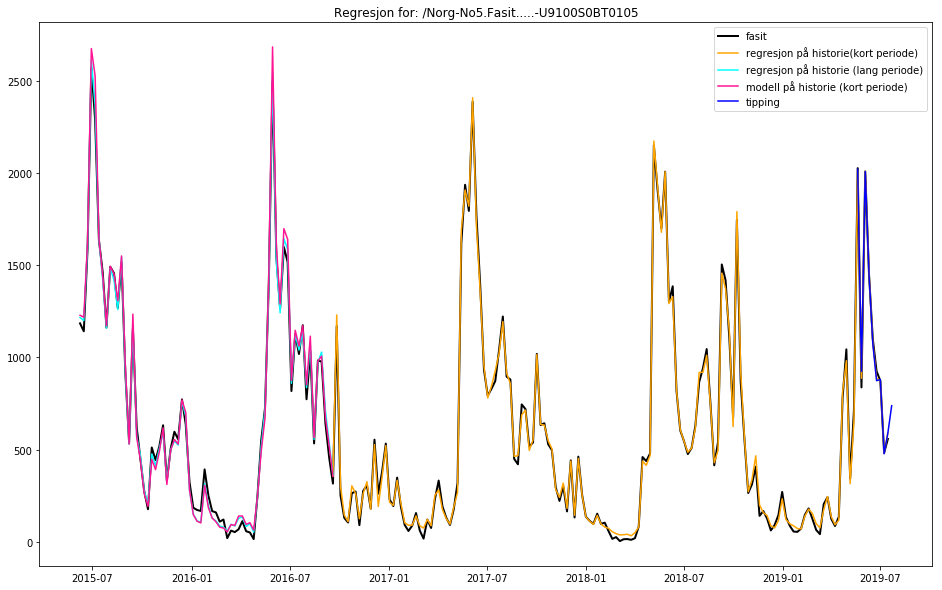

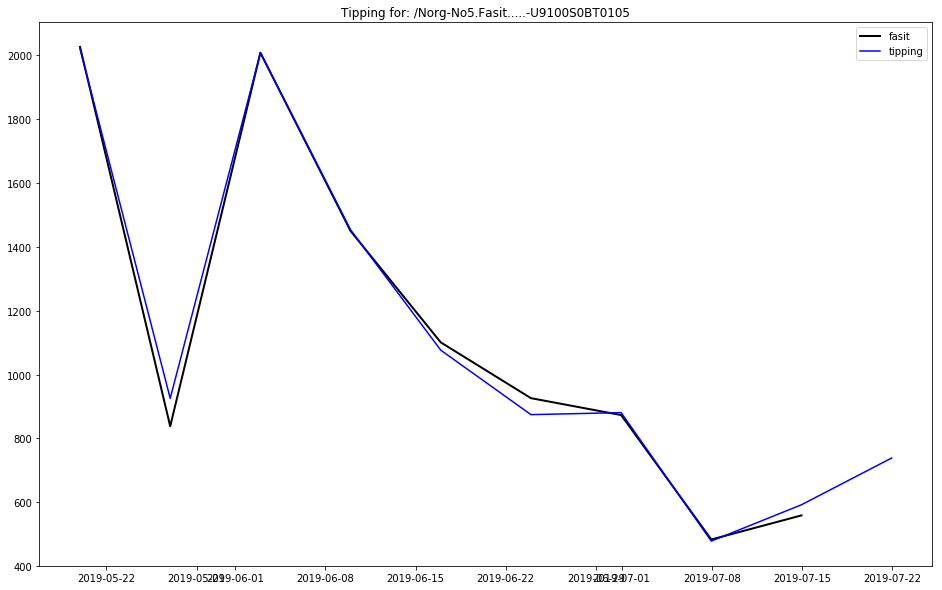

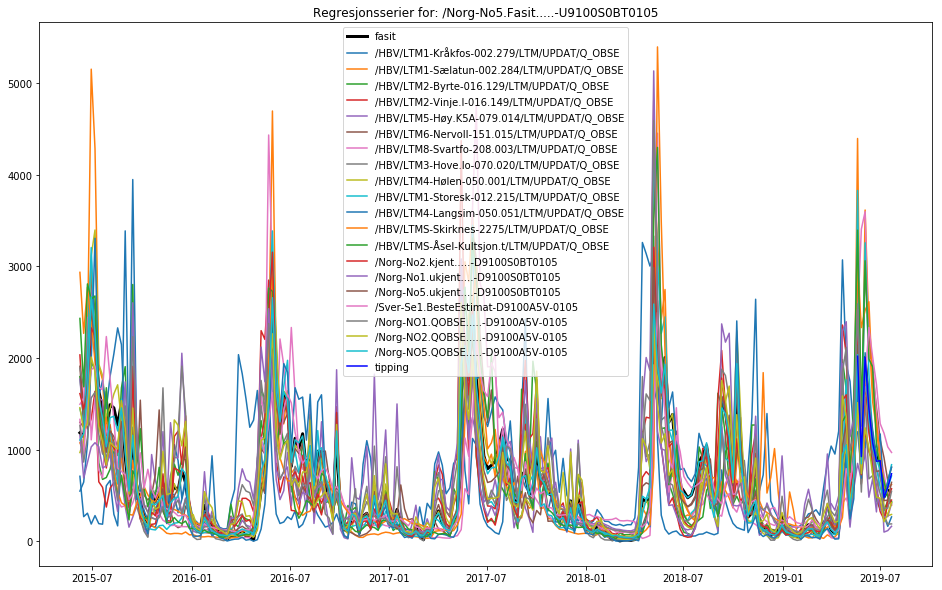


Skriver estimerte verdier til:  RegEstimatTilsigSE1-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE1.-U9100S0BT0105
Time to run write_V_SMG_Regresjon:  0.5322811603546143

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se1.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.10.05 til: 2019.07.15, satt til 197 uker.
Valgte 160 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
R2 for regresjonen (kort periode): 0.98945
R2 mellom fasit og tipping: 0.93579

Fasit:
 2019-06-24 00:00:00+01:00    1038.12796
2019-07-01 00:00:00+01:00     778.02250
2019-07-08 00:00:00+01:00     785.00124
2019-07-15 00:00:00+01:00     602.78752
Freq: W-SUN, Name: /Sver-Se1.Fasit.....-U9100S0B

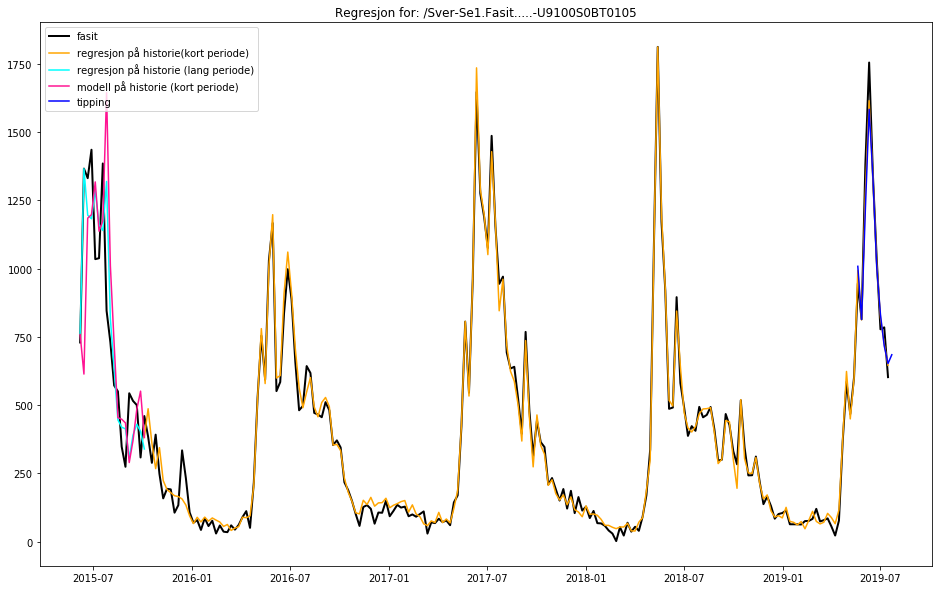

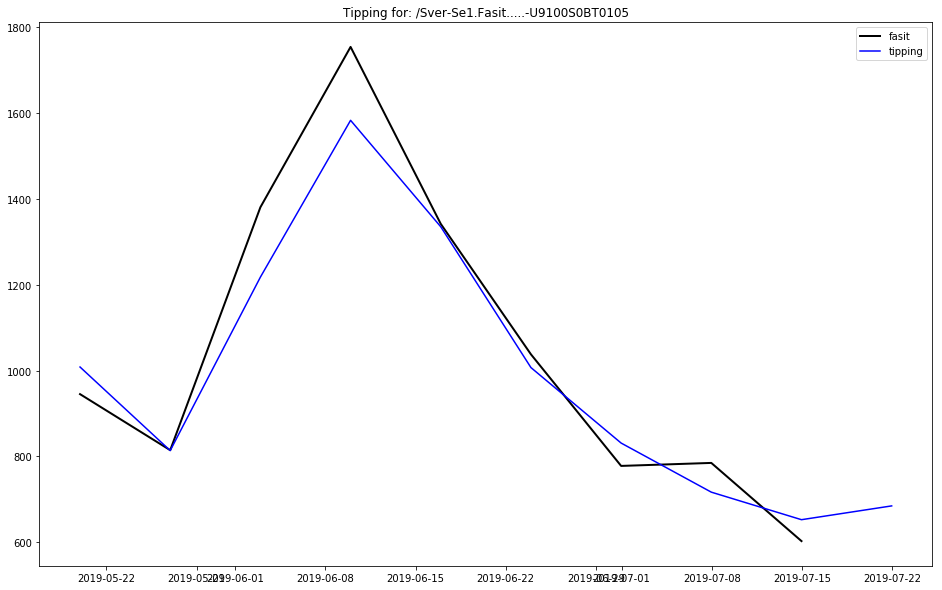

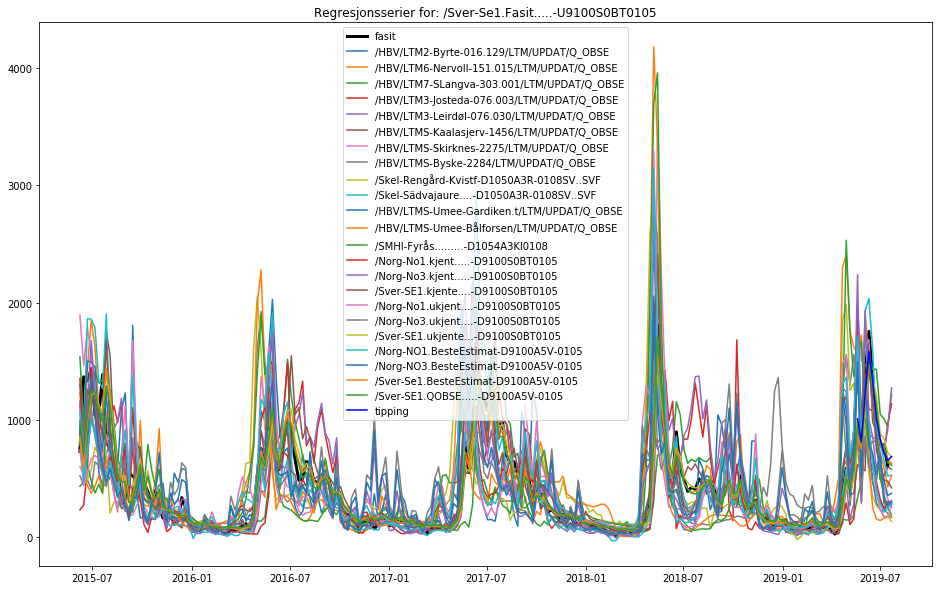


Skriver estimerte verdier til:  RegEstimatTilsigSE2-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE2.-U9100S0BT0105
Time to run write_V_SMG_Regresjon:  0.4845554828643799

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se2.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2017.06.26 til: 2019.07.15, satt til 107 uker.
Valgte 148 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
R2 for regresjonen (kort periode): 0.99782
R2 mellom fasit og tipping: 0.99557

Fasit:
 2019-06-24 00:00:00+01:00    974.27069
2019-07-01 00:00:00+01:00    801.05572
2019-07-08 00:00:00+01:00    594.10017
2019-07-15 00:00:00+01:00    440.02705
Freq: W-SUN, Name: /Sver-Se2.Fasit.....-U9100S0BT010

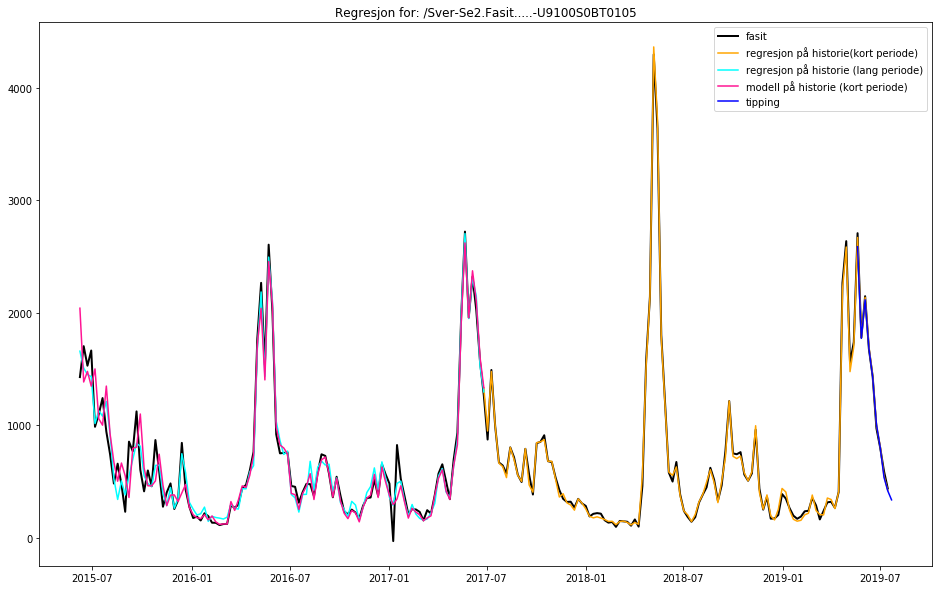

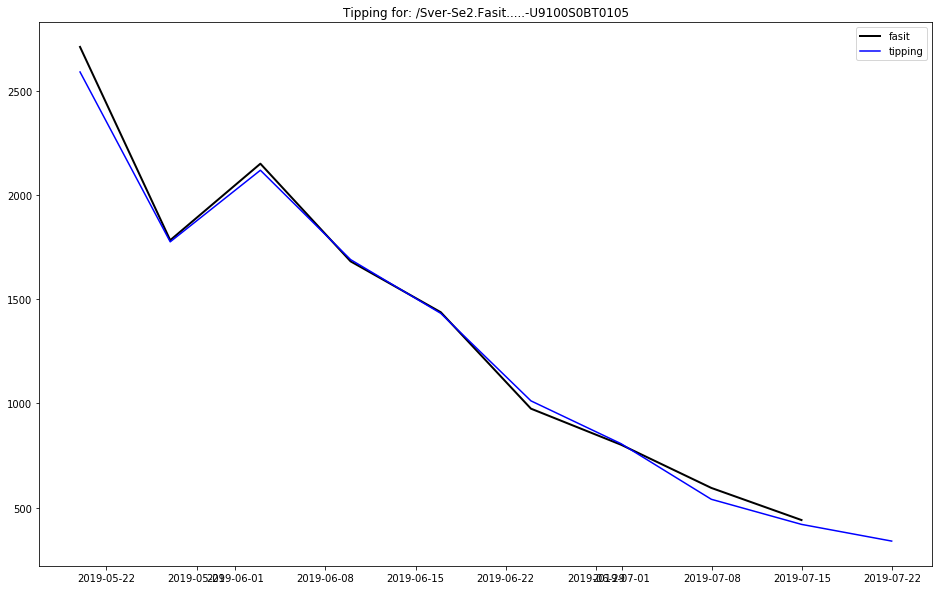

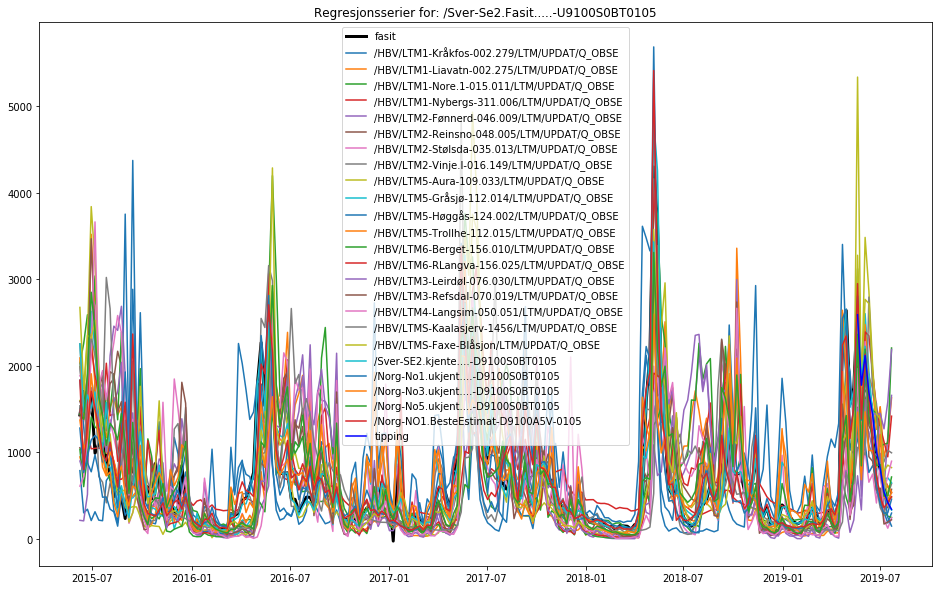


Skriver estimerte verdier til:  RegEstimatTilsigSE3-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE3.-U9100S0BT0105
Time to run write_V_SMG_Regresjon:  0.390791654586792

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se3.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2016.07.11 til: 2019.07.15, satt til 157 uker.
Valgte 174 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 16 stk.
R2 for regresjonen (kort periode): 0.91071
R2 mellom fasit og tipping: 0.80340

Fasit:
 2019-06-24 00:00:00+01:00    150.35335
2019-07-01 00:00:00+01:00    114.59656
2019-07-08 00:00:00+01:00     81.32789
2019-07-15 00:00:00+01:00     83.11734
Freq: W-SUN, Name: /Sver-Se3.Fasit.....-U9100S0BT0105

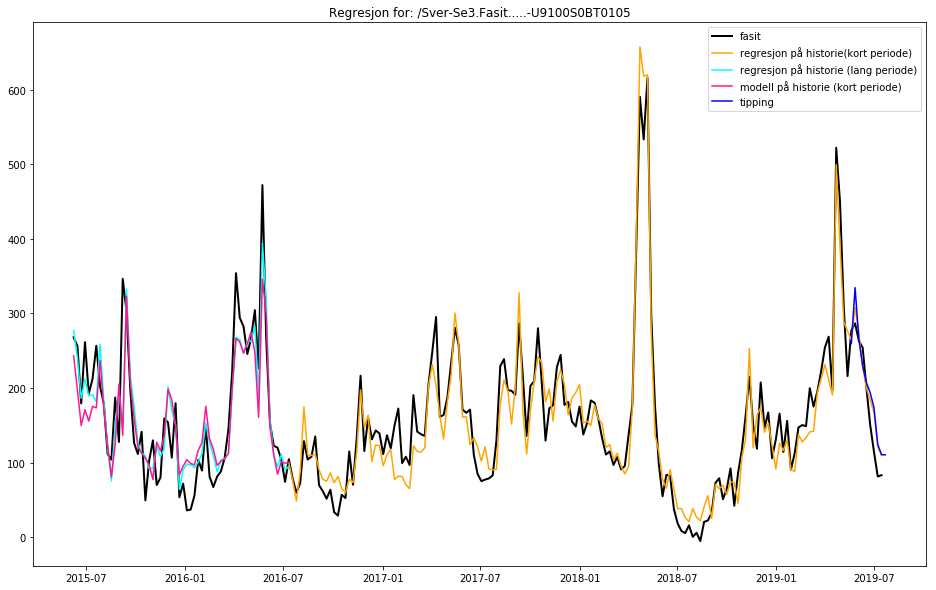

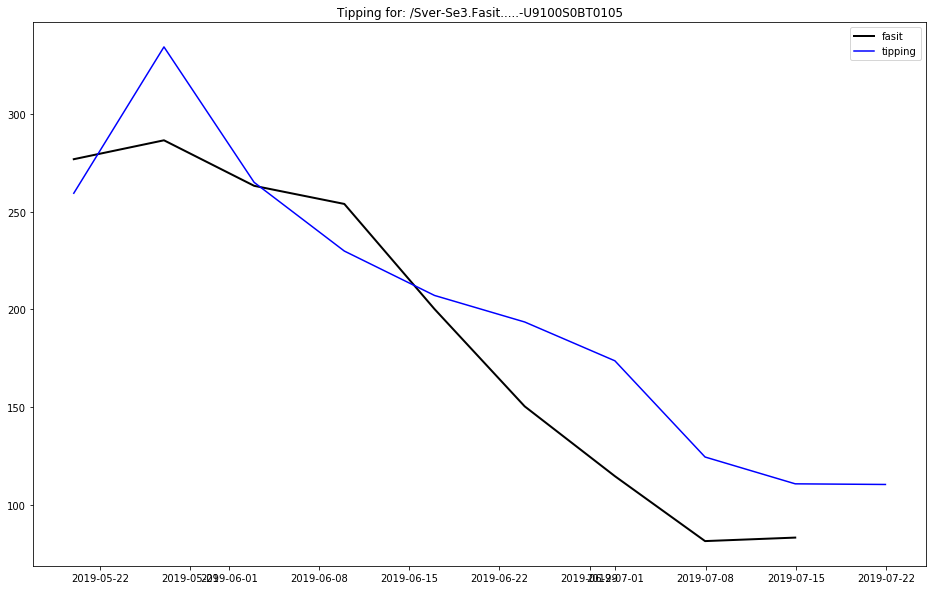

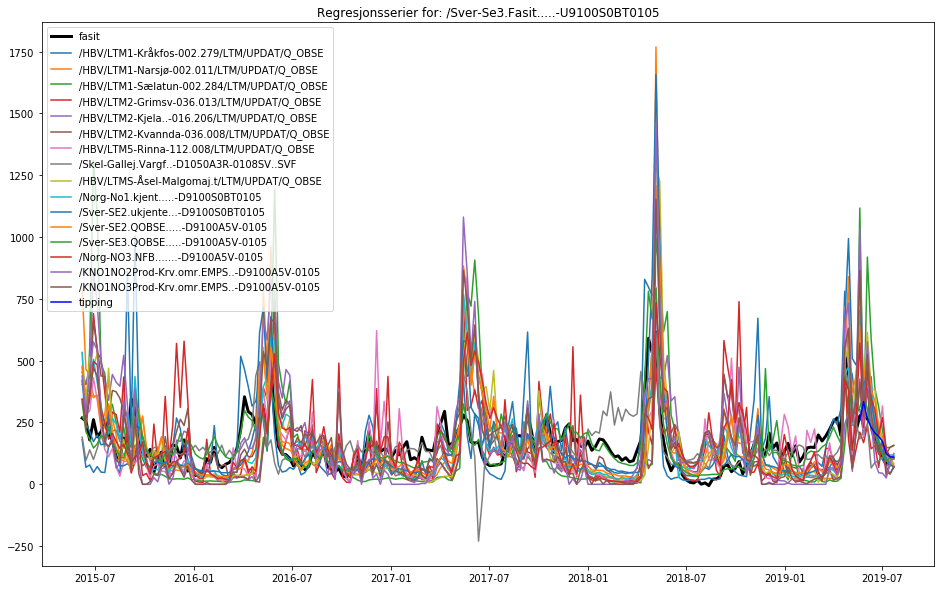


Skriver estimerte verdier til:  RegEstimatTilsigSE4-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE4.-U9100S0BT0105
Time to run write_V_SMG_Regresjon:  0.43784141540527344

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se4.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.07.15.
Input variablene (reg_period og ant_kandidater) ble funnet ved tuning.
Regresjonsperiode brukt på modellen for siste tipping: 2015.07.27 til: 2019.07.15, satt til 207 uker.
Valgte 180 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 20 stk.
R2 for regresjonen (kort periode): 0.93889
R2 mellom fasit og tipping: 0.59544

Fasit:
 2019-06-24 00:00:00+01:00    5.209531
2019-07-01 00:00:00+01:00    5.996801
2019-07-08 00:00:00+01:00    8.152159
2019-07-15 00:00:00+01:00    2.947977
Freq: W-SUN, Name: /Sver-Se4.Fasit.....-U9100S0BT0105, 

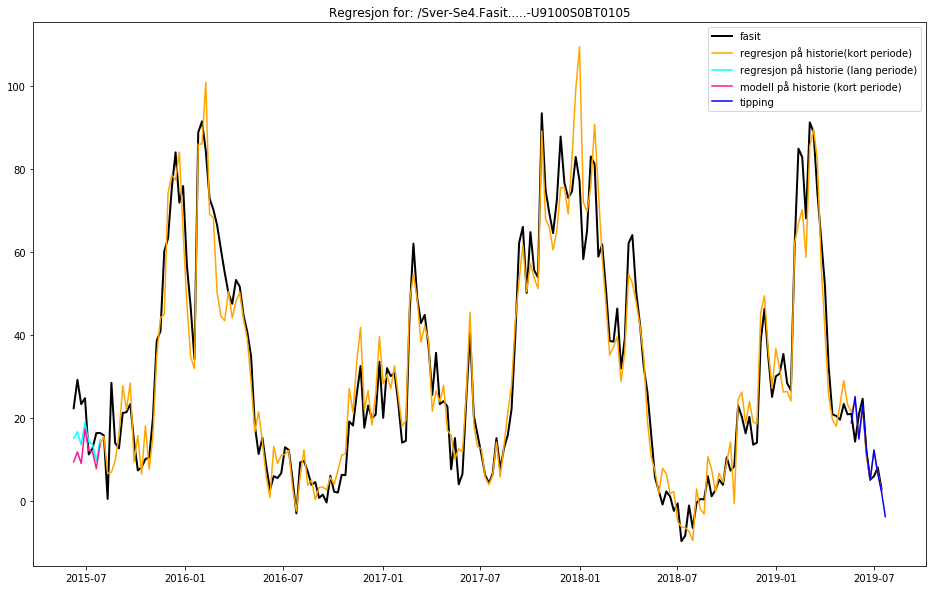

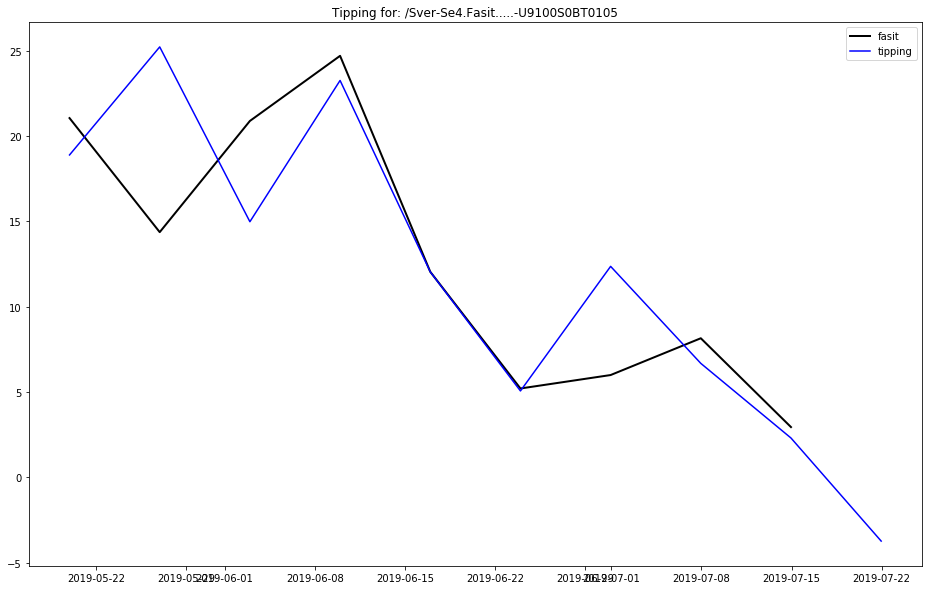

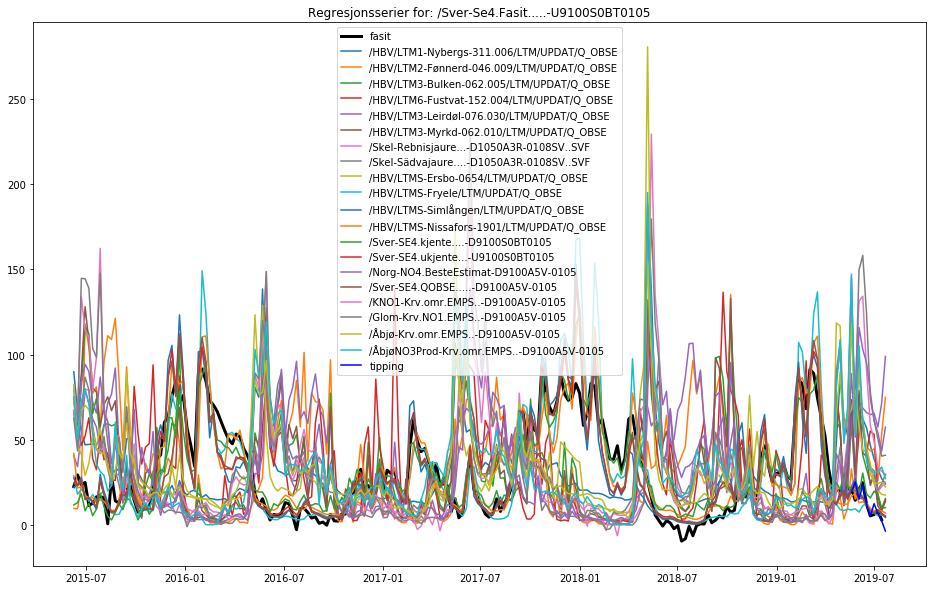


The script ran successfully and used a total of 1 minutes



In [2]:
from datetime import datetime
start_loop = utctime_now()

for variable in ['magasin', 'tilsig']:
    
    df_week, MagKap, period, forecast_time, read_start = auto_input[variable]
    reg_end = (pd.to_datetime(time.strftime(forecast_time), format="%Y.%m.%d") - Timedelta(days=7)).strftime('%Y.%m.%d')
    if (0 <= today.weekday() <= 1) or (today.weekday() == 2 and today.hour < 14):  # True for tipping
        last_forecast = forecast_time
    else:
        last_forecast = reg_end
    df_cleaned = deletingNaNs(df_week.loc[:last_forecast])
    
    for region in ['NO1', 'NO2', 'NO3', 'NO4', 'NO5', 'SE1', 'SE2', 'SE3', 'SE4']:
        start_time_loop = utctime_now()
        fasit, fasit_key = make_fasit(variable, region, reg_end, period)
                    
        if fasit[fasit_key].isnull().any():
            print('OBS: Det mangler verdier på fasiten! Går videre til neste region i loopen..')
            continue
            
        sorted_r2 = get_R2_sorted(variable, df_cleaned, fasit, fasit_key)
        short_period, max_p, ant_kandidater, input_file = get_input_variables_from_file(variable, region, backup=False)
        chosen_r2 = sorted_r2[:ant_kandidater]
        
        input1 = make_estimate(df_cleaned, fasit, fasit_key, last_forecast, short_period, max_p, chosen_r2, loop=False)
        fasit, long_results, short_results, df_tot, chosen_p, chosen_r2, r2_modelled, prediction, tipping_df, short_period, nb_weeks_tipping = input1
        input2 = fasit_key, ant_kandidater, max_p, reg_end, read_start
        
        # write to SMG:
        write_SMG_regresjon(variable, region, tipping_df)
        
        # write to SMG, virtual:
        write_V_SMG_Regresjon(short_results, chosen_p, fasit_key, r2_modelled, MagKap)
        
        show_result_jupyter(input1, input2)
        
print('\nThe script ran successfully and used a total of %.0f minutes\n' %((utctime_now() - start_loop)/60))
